# Модуль В. Построение, обучение и оптимизация модели

## 3.1 Разведочный анализ данных

Проведите сравнительный анализ и сопоставьте выявленные кластеры в наборах данных по годам. Для каждого кластера выявите не менее двух характеристик, проявляющих устойчивые закономерности на протяжении трёх лет. Опишите эти закономерности.

### План

    Загрузка библиотек;
    Загрузка данных;
    Сопоставление кластеров;
    Выявление закономерностей; 
    

###  Загрузка библиотек

In [1]:
# !pip install sktime

In [2]:
# !pip install statsmodels

In [ ]:
# !pip install pmdarima

In [ ]:
# pip install tbats

In [3]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import datetime
import sktime
from statsmodels.tsa.seasonal import seasonal_decompose


from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

import pickle

import warnings
warnings.filterwarnings(action="ignore")

### Загрузка наборов данных

In [4]:
df2019 = pd.read_csv('clust_df2019.csv')

In [5]:
df2020 = pd.read_csv('clust_df2020.csv')

In [6]:
df2021 = pd.read_csv('clust_df2021.csv')

In [7]:
df2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16339164 entries, 0 to 16339163
Data columns (total 17 columns):
 #   Column                Dtype  
---  ------                -----  
 0   VendorID              float64
 1   passenger_count       float64
 2   tpep_pickup_datetime  object 
 3   extra                 float64
 4   month                 int64  
 5   PULocationID          int64  
 6   trip_distance         float64
 7   RatecodeID            float64
 8   DOLocationID          int64  
 9   payment_type          float64
 10  fare_amount           float64
 11  mta_tax               float64
 12  tolls_amount          float64
 13  congestion_surcharge  float64
 14  total_amount          float64
 15  cluster               int64  
 16  name_cluster          object 
dtypes: float64(11), int64(4), object(2)
memory usage: 2.1+ GB


Исправим тип данных для даты.

In [8]:
df2019['tpep_pickup_datetime'] = pd.to_datetime(df2019['tpep_pickup_datetime'])

In [9]:
df2020['tpep_pickup_datetime'] = pd.to_datetime(df2020['tpep_pickup_datetime'])

In [10]:
df2021['tpep_pickup_datetime'] = pd.to_datetime(df2021['tpep_pickup_datetime'])

In [11]:
df2019[df2019['tpep_pickup_datetime'].dt.year != 2019]

,VendorID,passenger_count,tpep_pickup_datetime,extra,month,PULocationID,trip_distance,RatecodeID,DOLocationID,payment_type,fare_amount,mta_tax,tolls_amount,congestion_surcharge,total_amount,cluster,name_cluster
0,2.0,1.0,2009-01-01 00:03:44,1.0,1,138,10.67,1.0,164,1.0,36.0,0.5,6.12,2.5,55.70,4,Проезд - меньше среднего
1,2.0,1.0,2009-01-01 00:28:54,0.0,1,234,9.96,1.0,138,2.0,28.5,0.5,6.12,2.5,37.92,4,Проезд - меньше среднего
2,2.0,1.0,2009-01-01 10:51:34,0.5,1,233,2.21,1.0,90,2.0,12.5,0.5,0.00,2.5,16.30,2,Проезд - средний
3,2.0,1.0,2009-01-01 01:05:31,0.0,1,239,2.03,1.0,239,2.0,8.0,0.5,0.00,2.5,11.30,0,Проезд - минимум
4,2.0,3.0,2009-01-01 00:08:28,0.0,1,24,3.30,1.0,230,2.0,13.5,0.5,0.00,2.5,16.80,1,Проезд - больше среднего
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16339136,2.0,1.0,2008-12-31 23:07:18,0.0,12,132,10.03,4.0,265,2.0,39.0,0.5,0.00,0.0,39.80,1,Проезд - больше среднего
16339138,2.0,1.0,2008-12-31 22:05:14,1.0,12,138,6.78,1.0,255,1.0,25.0,0.5,0.00,0.0,32.16,1,Проезд - больше среднего
16339146,2.0,6.0,2008-12-31 23:19:06,0.0,12,162,6.50,1.0,65,2.0,24.5,0.5,0.00,2.5,27.80,2,Проезд - средний
16339155,2.0,5.0,2008-12-31 23:14:20,1.0,12,161,0.73,1.0,230,2.0,9.5,0.5,0.00,2.5,13.80,0,Проезд - минимум


Удалим данные строчки, не будем преполагать что это ошибка ввода, можем испортить статистику.

In [12]:
df2019 = df2019[df2019['tpep_pickup_datetime'].dt.year == 2019]

In [13]:
df2019[df2019['tpep_pickup_datetime'].dt.year != 2019].shape[0]

0

Те же действия проделаем с данными за 2020 и 2021 год.

In [14]:
df2020[df2020['tpep_pickup_datetime'].dt.year != 2020]

,VendorID,passenger_count,tpep_pickup_datetime,extra,month,PULocationID,trip_distance,RatecodeID,DOLocationID,payment_type,fare_amount,mta_tax,tolls_amount,congestion_surcharge,total_amount,cluster,name_cluster
16928,2.0,1.0,2009-01-01 00:19:46,0.0,1,138,9.27,1.0,97,1.0,38.0,0.5,0.0,0.0,50.44,3,Проезд - средний
57569,2.0,1.0,2009-01-01 02:01:16,0.5,1,163,5.52,1.0,83,2.0,20.0,0.5,0.0,2.5,23.80,3,Проезд - средний
93264,2.0,1.0,2009-01-01 10:49:41,0.0,1,193,0.00,1.0,193,3.0,2.5,0.5,0.0,0.0,3.30,3,Проезд - средний
103369,2.0,1.0,2009-01-01 00:06:23,0.0,1,79,1.23,1.0,148,1.0,8.5,0.5,0.0,2.5,14.16,3,Проезд - средний
136262,2.0,1.0,2009-01-01 00:44:25,0.0,1,249,0.96,1.0,231,2.0,6.0,0.5,0.0,2.5,9.30,3,Проезд - средний
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9735294,2.0,2.0,2019-12-31 23:45:20,0.5,12,231,4.04,1.0,246,1.0,16.5,0.5,0.0,2.5,24.36,4,Проезд - минимум
9736222,2.0,2.0,2019-12-31 23:59:50,0.5,12,249,1.50,1.0,246,1.0,8.0,0.5,0.0,2.5,14.16,4,Проезд - минимум
9740851,2.0,1.0,2019-12-31 19:40:23,0.5,12,87,1.94,1.0,249,1.0,9.5,0.5,0.0,2.5,14.74,4,Проезд - минимум
9751662,2.0,1.0,2019-12-31 16:12:01,0.5,12,90,4.09,1.0,238,1.0,15.5,0.5,0.0,2.5,21.30,4,Проезд - минимум


In [15]:
df2020 = df2020[df2020['tpep_pickup_datetime'].dt.year == 2020]

In [16]:
df2021[df2021['tpep_pickup_datetime'].dt.year != 2021]

,VendorID,passenger_count,tpep_pickup_datetime,extra,month,PULocationID,trip_distance,RatecodeID,DOLocationID,payment_type,fare_amount,mta_tax,tolls_amount,congestion_surcharge,total_amount,cluster,name_cluster
302,2.0,1.0,2009-01-01 00:17:33,0.5,1,141,1.41,1.0,263,1.0,6.5,0.5,0.00,2.5,11.30,0,Проезд - минимум
7889,2.0,1.0,2009-01-01 16:16:55,1.0,1,137,9.77,1.0,138,1.0,32.0,0.5,6.55,2.5,53.56,0,Проезд - минимум
23820,2.0,2.0,2022-01-22 00:47:41,0.5,1,249,1.92,1.0,13,1.0,9.5,0.5,0.00,2.5,16.62,0,Проезд - минимум
42472,2.0,1.0,2009-01-01 05:26:03,0.0,1,186,1.53,1.0,113,2.0,6.5,0.5,0.00,2.5,9.80,0,Проезд - минимум
49613,2.0,1.0,2009-01-01 00:04:14,0.0,1,234,1.35,1.0,158,2.0,10.0,0.5,0.00,2.5,13.30,0,Проезд - минимум
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11824742,2.0,1.0,2008-12-31 23:26:28,0.5,12,255,1.93,1.0,246,1.0,8.5,0.5,0.00,2.5,14.76,2,Проезд - средний
11855715,2.0,1.0,2008-12-31 23:09:29,0.0,12,161,2.45,1.0,140,2.0,12.5,0.5,0.00,2.5,15.80,2,Проезд - средний
12005798,2.0,2.0,2008-12-31 22:57:07,2.5,12,239,0.40,5.0,264,2.0,7.0,0.5,0.00,0.0,10.30,4,Проезд - высокий
12027897,2.0,3.0,2008-12-31 23:10:07,0.5,12,138,10.20,1.0,161,2.0,30.5,0.5,6.55,2.5,42.10,2,Проезд - средний


In [17]:
df2021 = df2021[df2021['tpep_pickup_datetime'].dt.year == 2021]

In [18]:
lst_df = [df2019, df2020, df2021]

Данные проверены можно приступать к сопоставлению кластеров.

### Сопоставление кластеров

Для того чтобы сопоставить кластеры будем выводить данные по названию кластера. Используем только некоторые колонки для удобства просмотра.

In [19]:
columns = ['tpep_pickup_datetime', 'trip_distance', 'fare_amount', 'congestion_surcharge', 'cluster', 'name_cluster']

#### Кластер "Проезд - минимум"

In [20]:
name_clust = 'Проезд - минимум'

In [21]:
lst_df[0][lst_df[0]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
7626519,2019-08-07 07:07:49,4.80,17.0,2.5,0,Проезд - минимум
16299062,2019-11-15 21:49:33,20.69,56.0,2.5,0,Проезд - минимум
15371505,2019-11-14 23:52:55,8.20,27.5,2.5,0,Проезд - минимум
14031042,2019-10-30 17:38:28,0.90,7.5,2.5,0,Проезд - минимум
11048556,2019-09-12 15:42:42,0.73,5.0,2.5,0,Проезд - минимум


In [22]:
lst_df[1][lst_df[1]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
8292063,2020-10-05 09:33:05,1.06,7.0,2.5,4,Проезд - минимум
9375383,2020-12-08 15:40:40,1.13,7.0,2.5,4,Проезд - минимум
9732632,2020-12-28 16:02:19,2.14,8.5,2.5,4,Проезд - минимум
7662516,2020-09-07 19:10:12,8.48,25.0,0.0,4,Проезд - минимум
9667145,2020-12-23 09:18:16,2.05,9.0,2.5,4,Проезд - минимум


In [23]:
lst_df[2][lst_df[2]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
6757283,2021-08-21 16:49:22,0.98,5.0,2.5,0,Проезд - минимум
1072555,2021-03-11 19:14:41,1.96,8.5,2.5,0,Проезд - минимум
5847389,2021-08-12 16:44:21,0.66,9.0,2.5,0,Проезд - минимум
4121738,2021-06-16 17:39:28,2.19,11.0,2.5,0,Проезд - минимум
81025,2021-01-31 10:23:43,1.76,8.0,2.5,0,Проезд - минимум


Можно заметить что данные находятся в одном диапазоне, то есть минимальные значения в милях и оплате по счётчику.

#### Кластер "Проезд - меньше среднего"

In [24]:
name_clust = 'Проезд - меньше среднего'

In [25]:
lst_df[0][lst_df[0]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
2570726,2019-06-03 09:32:36,1.50,10.0,2.5,4,Проезд - меньше среднего
5372422,2019-07-31 21:36:41,0.92,6.0,2.5,4,Проезд - меньше среднего
1682372,2019-06-24 18:32:34,0.99,6.5,2.5,4,Проезд - меньше среднего
12606131,2019-10-05 15:58:45,0.42,4.5,2.5,4,Проезд - меньше среднего
6315823,2019-08-09 14:47:17,1.20,8.0,2.5,4,Проезд - меньше среднего


In [26]:
lst_df[1][lst_df[1]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
6652663,2020-06-20 15:57:49,2.2,11.0,2.5,2,Проезд - меньше среднего
7966756,2020-09-25 17:34:54,1.6,10.0,2.5,2,Проезд - меньше среднего
9119444,2020-11-17 10:03:32,1.8,12.5,2.5,2,Проезд - меньше среднего
7412078,2020-08-10 20:33:46,1.4,7.0,2.5,2,Проезд - меньше среднего
8706865,2020-11-19 13:26:27,1.9,12.0,2.5,2,Проезд - меньше среднего


In [27]:
lst_df[2][lst_df[2]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
595187,2021-02-22 12:12:56,1.4,9.5,2.5,1,Проезд - меньше среднего
9308890,2021-10-16 11:50:12,0.6,4.0,2.5,1,Проезд - меньше среднего
3855755,2021-06-06 14:59:29,1.0,7.0,2.5,1,Проезд - меньше среднего
2046464,2021-04-12 19:10:34,1.0,6.5,2.5,1,Проезд - меньше среднего
741030,2021-02-03 18:10:25,0.7,5.5,2.5,1,Проезд - меньше среднего


#### Кластер "Проезд - средний"

In [28]:
name_clust = 'Проезд - средний'

In [29]:
lst_df[0][lst_df[0]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
1344215,2019-06-27 20:36:26,5.11,16.0,2.5,2,Проезд - средний
13709458,2019-10-15 16:38:14,1.01,7.0,2.5,2,Проезд - средний
4334764,2019-07-31 21:50:04,8.02,25.0,2.5,2,Проезд - средний
11048873,2019-09-22 01:02:14,3.40,14.5,2.5,2,Проезд - средний
7847334,2019-08-27 18:00:35,1.79,9.0,2.5,2,Проезд - средний


In [30]:
lst_df[1][lst_df[1]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
5475071,2020-03-04 10:07:07,0.80,6.0,2.5,3,Проезд - средний
2447556,2020-01-21 09:01:31,0.71,5.0,2.5,3,Проезд - средний
423404,2020-01-04 13:42:09,3.14,12.5,2.5,3,Проезд - средний
2387835,2020-01-03 06:00:15,1.32,7.0,2.5,3,Проезд - средний
4325655,2020-02-08 20:32:02,1.22,6.0,2.5,3,Проезд - средний


In [31]:
lst_df[2][lst_df[2]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
7668663,2021-09-09 15:51:18,1.14,7.0,2.5,2,Проезд - средний
8845905,2021-10-29 00:53:38,3.92,14.0,2.5,2,Проезд - средний
9763259,2021-11-02 17:30:20,2.44,11.5,2.5,2,Проезд - средний
11983384,2021-12-06 15:11:22,16.75,52.0,2.5,2,Проезд - средний
8300279,2021-10-13 17:49:13,1.04,8.5,2.5,2,Проезд - средний


#### Кластер "Проезд - больше среднего"

In [32]:
name_clust = 'Проезд - больше среднего'

In [33]:
lst_df[0][lst_df[0]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
4457623,2019-07-28 18:22:10,2.01,10.0,2.5,1,Проезд - больше среднего
9772205,2019-09-16 20:57:23,1.15,6.0,2.5,1,Проезд - больше среднего
9497534,2019-09-03 12:00:45,0.69,5.5,2.5,1,Проезд - больше среднего
3074283,2019-06-16 21:33:18,1.68,8.0,2.5,1,Проезд - больше среднего
15734953,2019-11-09 18:13:53,1.42,12.0,2.5,1,Проезд - больше среднего


In [34]:
lst_df[1][lst_df[1]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
2122253,2020-01-12 17:30:11,7.8,24.5,0.0,1,Проезд - больше среднего
5527412,2020-03-06 15:15:06,0.8,6.5,2.5,1,Проезд - больше среднего
1291097,2020-01-07 12:58:05,1.7,10.0,2.5,1,Проезд - больше среднего
4487160,2020-02-21 09:42:57,1.2,13.0,2.5,1,Проезд - больше среднего
1879125,2020-01-10 15:54:12,0.0,26.2,0.0,1,Проезд - больше среднего


#### Кластер "Проезд - высокий"

In [35]:
name_clust = 'Проезд - высокий'

In [36]:
lst_df[0][lst_df[0]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
6208107,2019-08-10 19:44:53,3.76,17.0,0.0,3,Проезд - высокий
9486403,2019-09-20 18:39:21,10.58,32.5,0.0,3,Проезд - высокий
964703,2019-06-27 23:44:22,16.22,47.0,0.0,3,Проезд - высокий
6117284,2019-07-22 18:27:06,21.01,61.5,0.0,3,Проезд - высокий
5888992,2019-07-16 14:02:10,3.61,14.0,0.0,3,Проезд - высокий


In [37]:
lst_df[1][lst_df[1]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
6821742,2020-07-07 13:59:59,1.20,6.5,2.5,0,Проезд - высокий
7505990,2020-09-08 14:47:41,2.71,16.5,2.5,0,Проезд - высокий
9228501,2020-12-30 19:39:07,1.55,7.0,2.5,0,Проезд - высокий
6900537,2020-07-29 12:20:06,0.82,7.0,2.5,0,Проезд - высокий
8839883,2020-11-25 14:31:47,0.43,4.5,0.0,0,Проезд - высокий


In [38]:
lst_df[2][lst_df[2]['name_cluster'] == name_clust].loc[:, columns].sample(5)

,tpep_pickup_datetime,trip_distance,fare_amount,congestion_surcharge,cluster,name_cluster
6784993,2021-08-10 02:53:41,2.49,10.5,0.0,4,Проезд - высокий
226826,2021-01-11 20:47:09,4.12,18.5,0.0,4,Проезд - высокий
11063179,2021-12-28 14:05:51,1.81,8.5,0.0,4,Проезд - высокий
8437062,2021-10-24 16:40:30,0.53,4.5,0.0,4,Проезд - высокий
9586653,2021-11-23 19:52:56,1.27,64.0,0.0,4,Проезд - высокий


#### Вывод

Кластеры сопоставлены по годам, зачения находятся примерно в одном диапазоне.

### Выявление закономерностей

Для того чтобы выявить закомерность, надо построить график в котором с течением времени будут отображаться значения, если эти значения будут повторяться то будем считать это закономерностью.

In [39]:
for i in range(len(lst_df)):
    lst_df[i]['tpep_pickup_datetime'] = pd.to_datetime(lst_df[i]['tpep_pickup_datetime']).dt.date

In [40]:
for i in range(len(lst_df)):
    lst_df[i].set_index('tpep_pickup_datetime', inplace = True)

In [41]:
lst_df[0].head()

,VendorID,passenger_count,extra,month,PULocationID,trip_distance,RatecodeID,DOLocationID,payment_type,fare_amount,mta_tax,tolls_amount,congestion_surcharge,total_amount,cluster,name_cluster
tpep_pickup_datetime,,,,,,,,,,,,,,,,
2019-05-25,1.0,2.0,3.0,5,144,2.00,1.0,246,4.0,9.5,0.5,0.00,2.5,13.30,0,Проезд - минимум
2019-05-24,2.0,3.0,0.0,5,234,0.37,1.0,234,1.0,3.5,0.5,0.00,2.5,8.16,0,Проезд - минимум
2019-05-27,2.0,1.0,0.5,5,48,0.81,1.0,68,1.0,4.5,0.5,0.00,2.5,10.38,2,Проезд - средний
2019-05-23,2.0,1.0,1.0,5,239,1.26,1.0,142,1.0,7.0,0.5,0.00,2.5,12.43,4,Проезд - меньше среднего
2019-05-28,1.0,2.0,2.5,5,48,21.20,2.0,132,1.0,52.0,0.5,6.12,2.5,76.77,1,Проезд - больше среднего


In [42]:
for i in range(len(lst_df)):
    lst_df[i].sort_index(inplace=True)

In [43]:
lst_df[0]

,VendorID,passenger_count,extra,month,PULocationID,trip_distance,RatecodeID,DOLocationID,payment_type,fare_amount,mta_tax,tolls_amount,congestion_surcharge,total_amount,cluster,name_cluster
tpep_pickup_datetime,,,,,,,,,,,,,,,,
2019-05-22,2.0,1.0,0.5,5,90,4.34,1.0,263,1.0,16.5,0.5,0.0,2.5,24.36,1,Проезд - больше среднего
2019-05-22,2.0,1.0,0.0,5,116,0.75,1.0,152,1.0,4.5,0.5,0.0,0.0,6.30,3,Проезд - высокий
2019-05-22,2.0,1.0,1.0,5,90,0.38,1.0,249,1.0,3.5,0.5,0.0,2.5,9.36,1,Проезд - больше среднего
2019-05-22,2.0,1.0,0.5,5,100,2.01,1.0,143,1.0,9.5,0.5,0.0,2.5,15.96,1,Проезд - больше среднего
2019-05-22,2.0,1.0,0.0,5,238,4.32,1.0,244,1.0,17.0,0.5,0.0,2.5,25.38,0,Проезд - минимум
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-27,2.0,1.0,0.0,12,132,0.02,1.0,132,2.0,2.5,0.5,0.0,0.0,3.30,3,Проезд - высокий
2019-12-28,2.0,1.0,0.5,12,209,9.80,1.0,238,1.0,30.0,0.5,0.0,2.5,40.56,0,Проезд - минимум
2019-12-28,2.0,1.0,0.5,12,48,2.47,1.0,249,1.0,10.5,0.5,0.0,2.5,16.44,1,Проезд - больше среднего


Признаки которые могут иметь закономерность, запишем их в список для простого вывода.

In [44]:
columns = ['passenger_count','extra','trip_distance','fare_amount','mta_tax','tolls_amount','congestion_surcharge','total_amount']

In [45]:
def output_graph_pattern(clust):
    for column in columns:
        for i in range(len(lst_df)):
            df = lst_df[i].loc[lst_df[i]['name_cluster'] == clust, column]
            df_date_gr = pd.DataFrame(df.groupby(df.index).sum())
            df_date_gr[column].plot()
            ax = df_date_gr[column].plot(figsize = (10,3), legend = None)
            ax.set(title = f'{clust} - {column}', xlabel = f'Набор {i+1}', ylabel = 'Значения')
            plt.show()

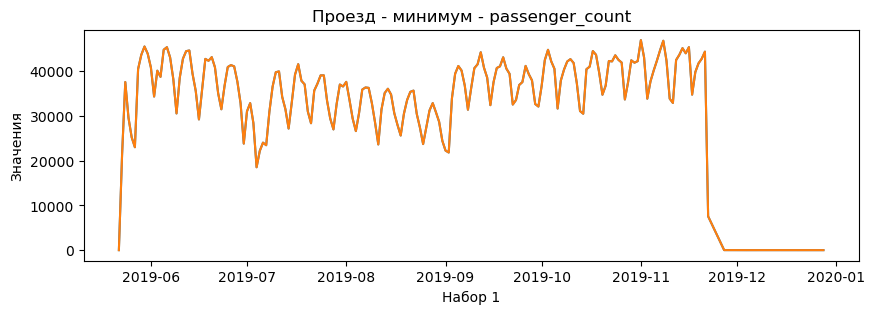

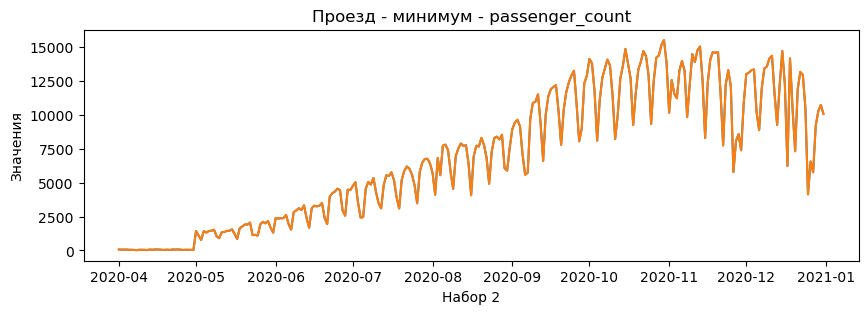

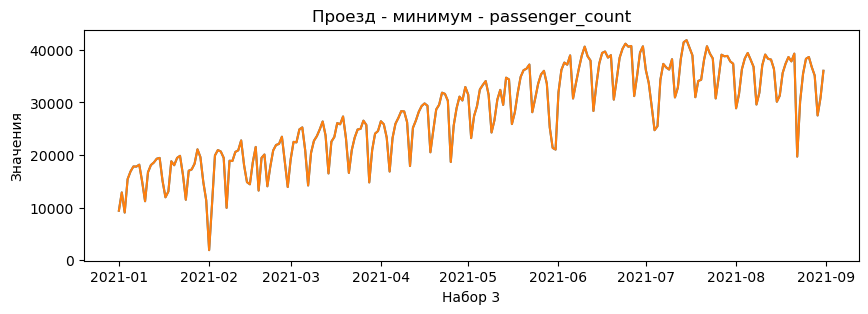

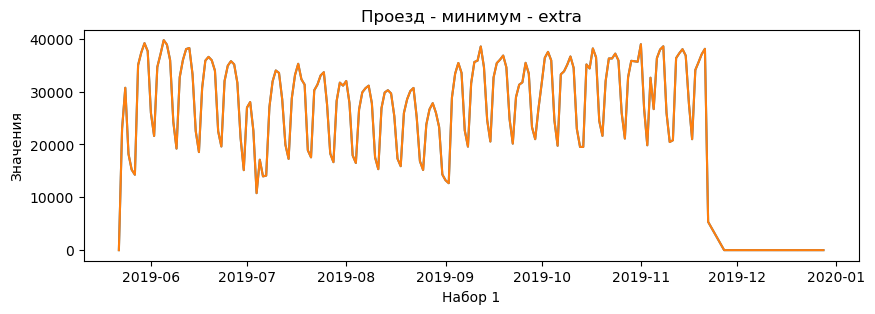

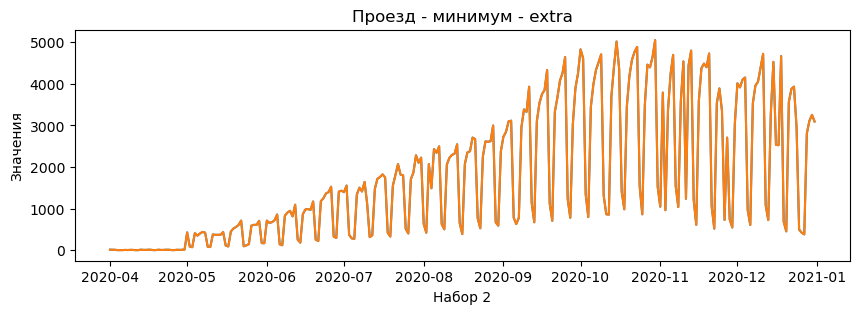

...

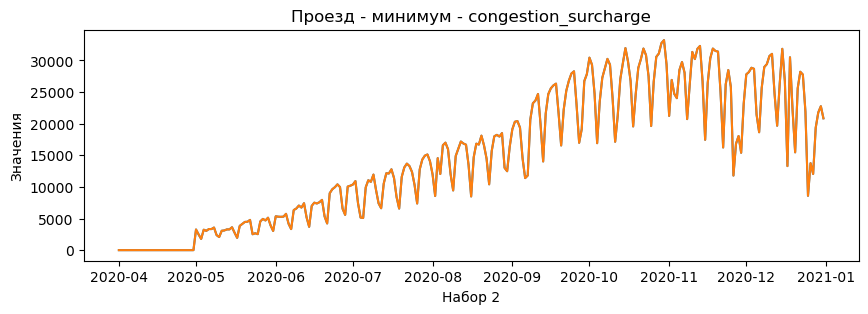

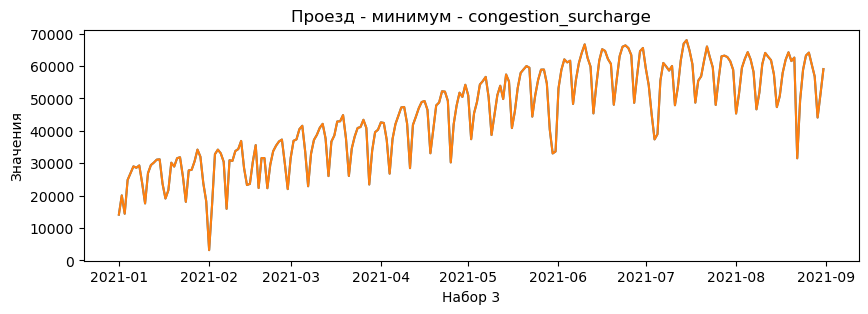

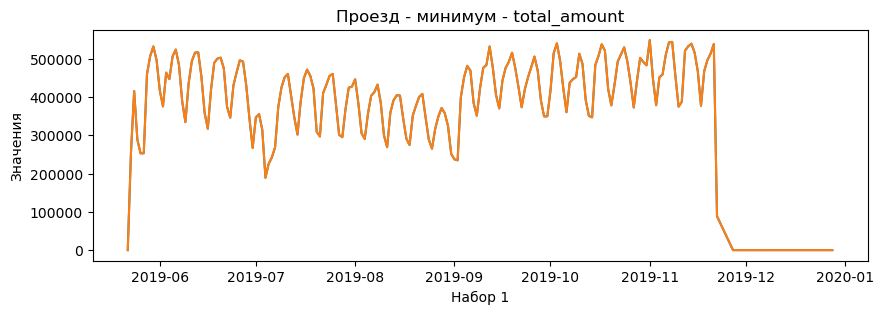

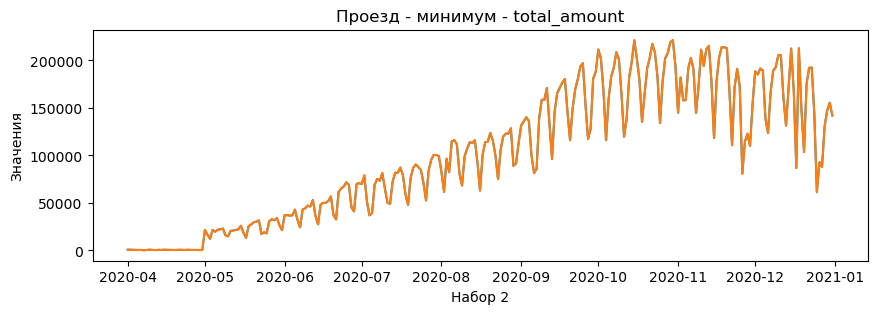

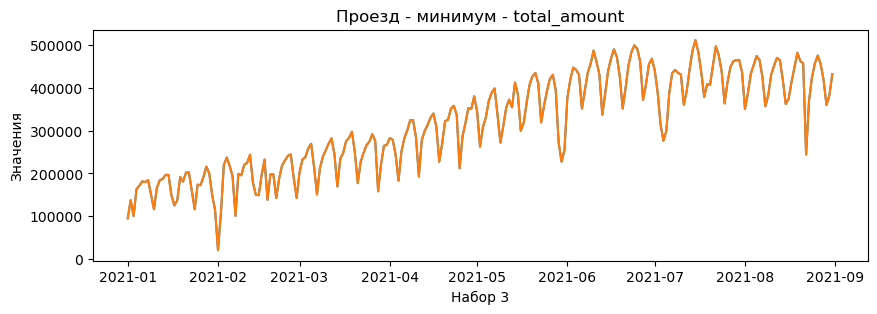

In [46]:
output_graph_pattern('Проезд - минимум')

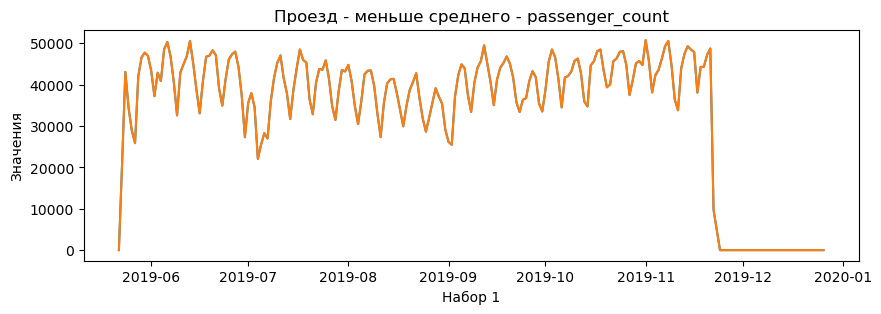

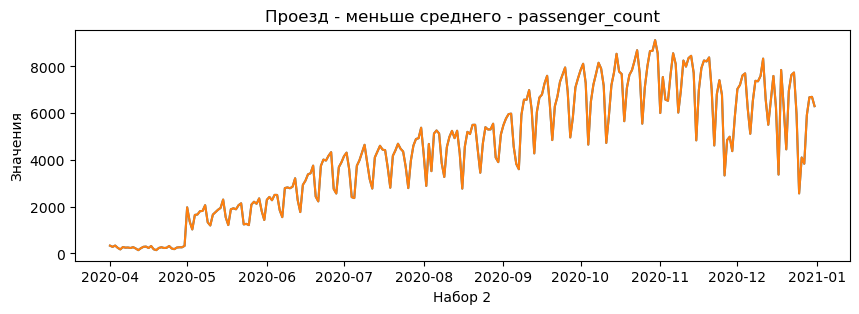

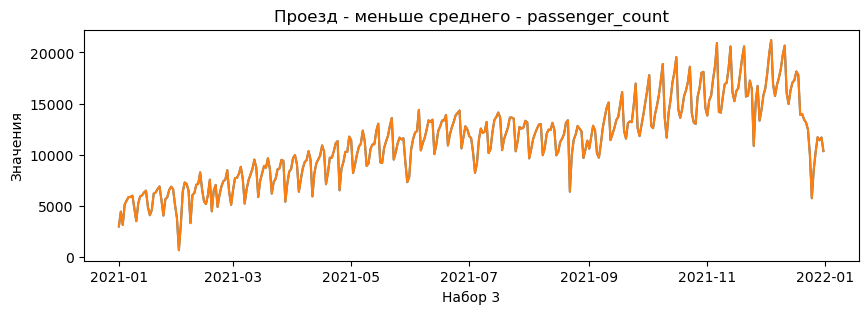

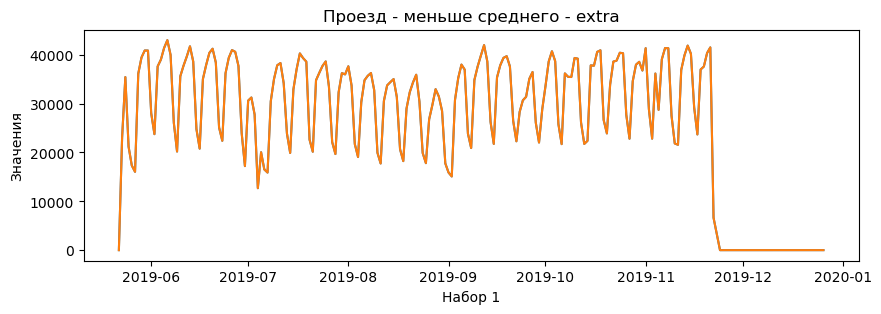

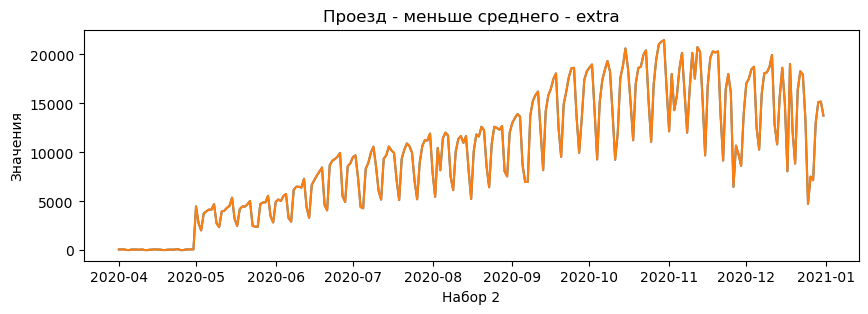

...

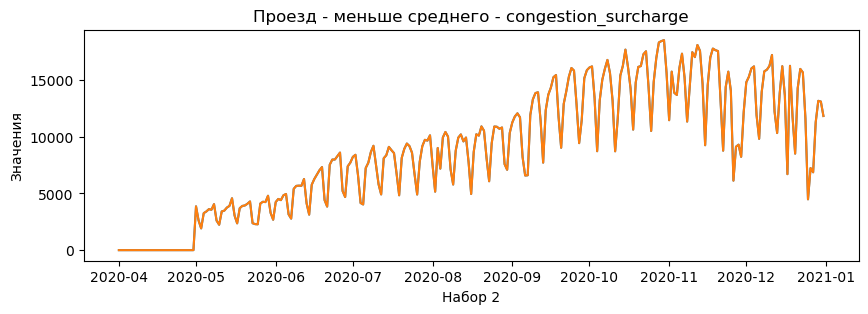

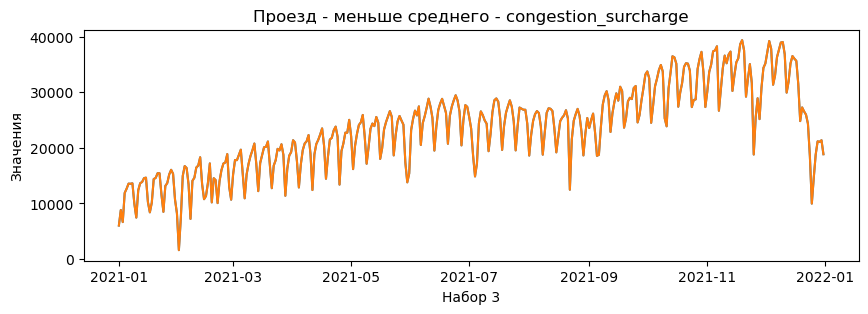

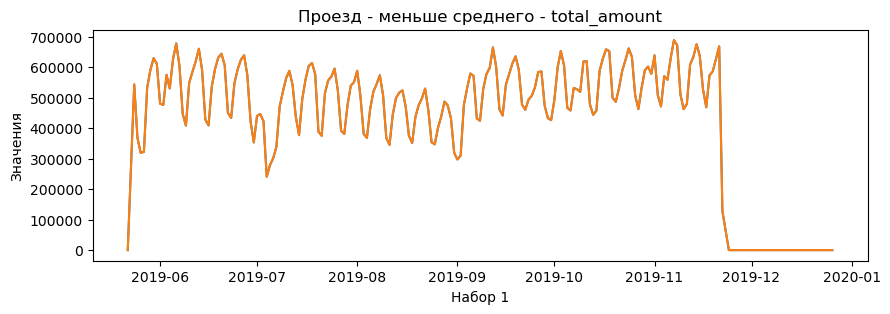

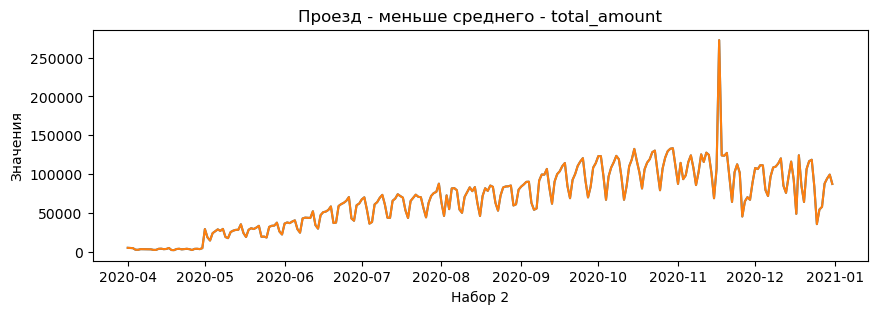

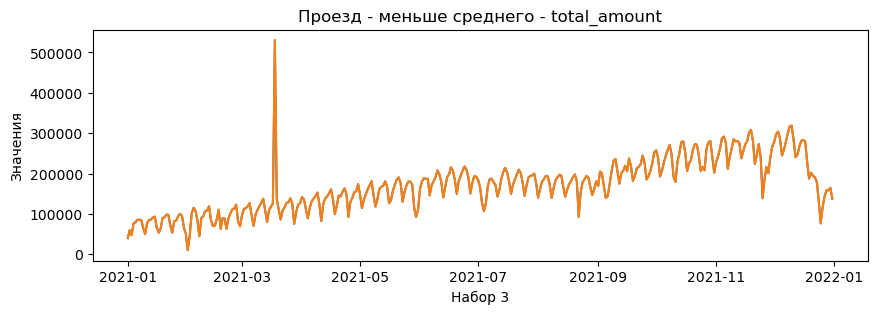

In [47]:
output_graph_pattern('Проезд - меньше среднего')

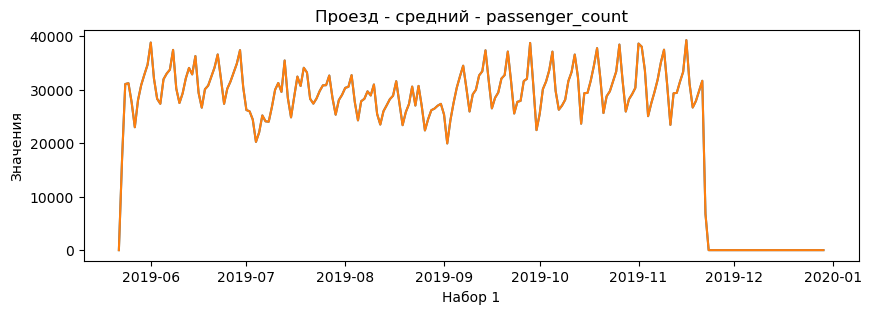

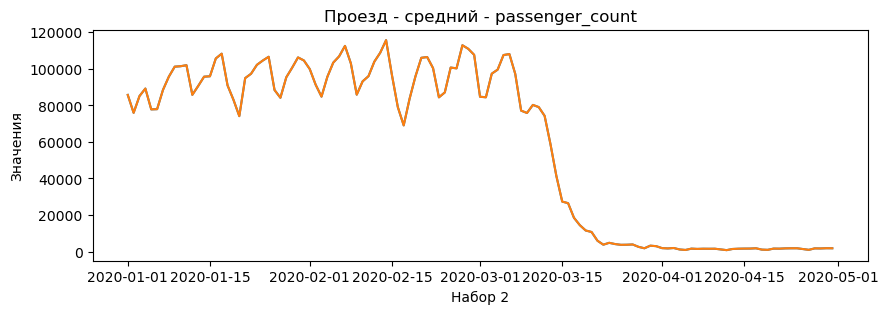

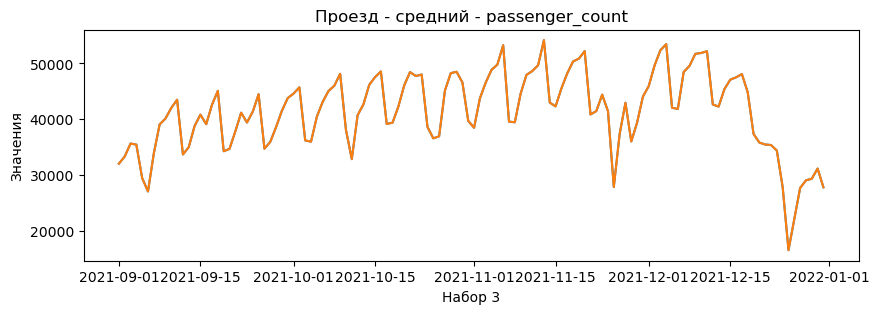

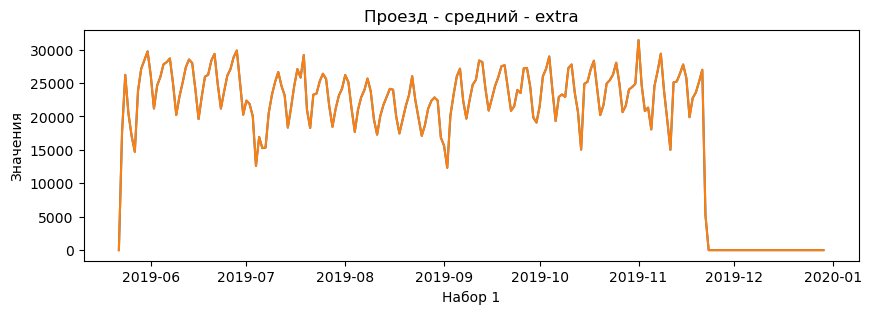

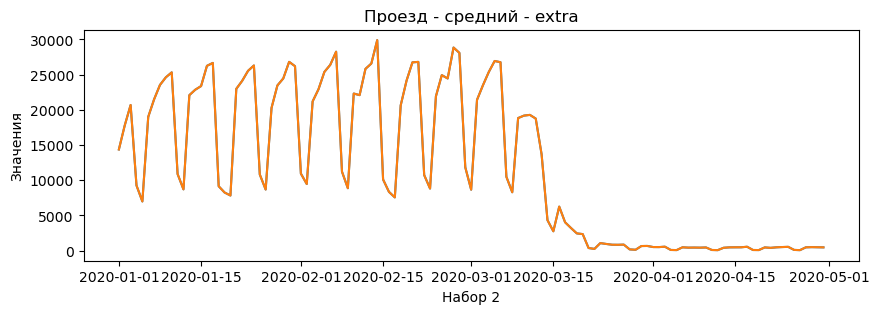

...

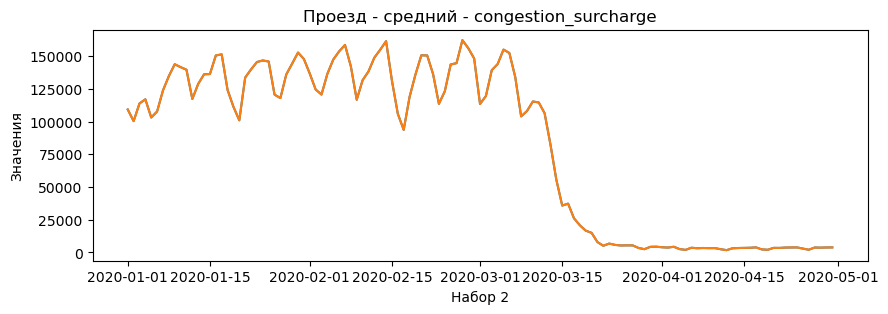

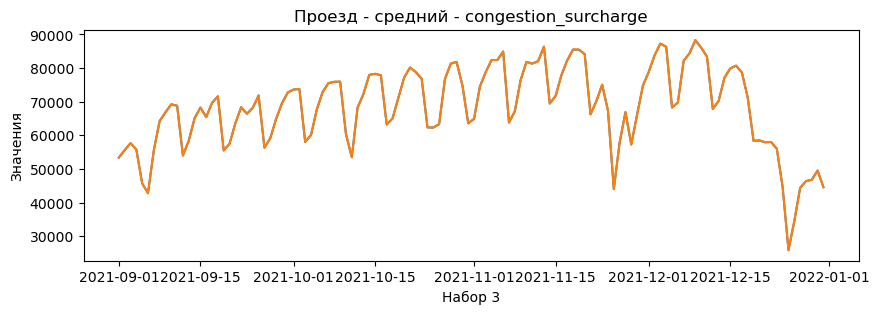

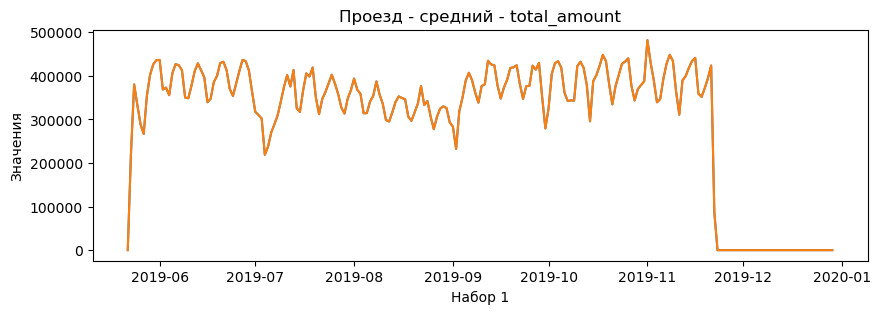

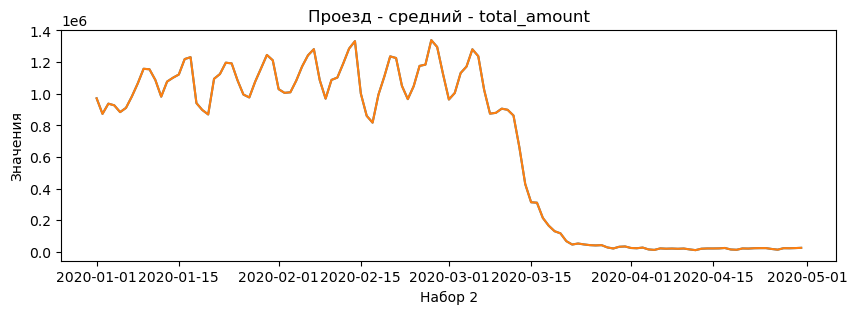

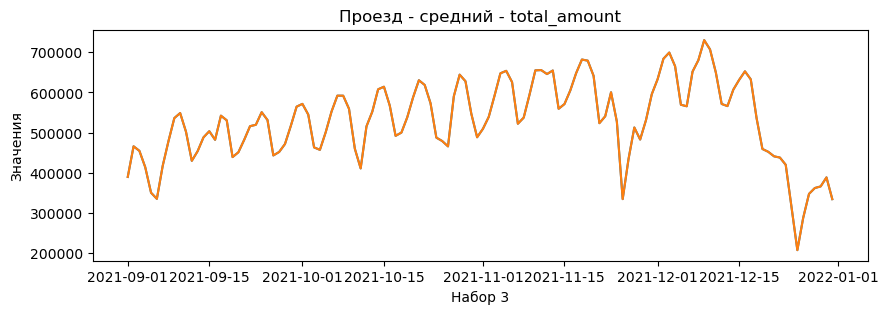

In [48]:
output_graph_pattern('Проезд - средний')

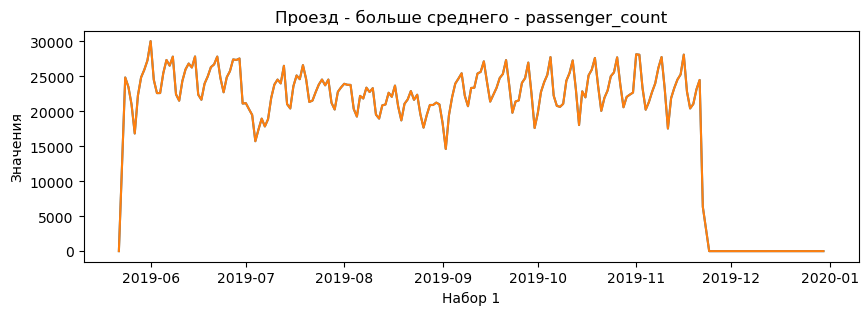

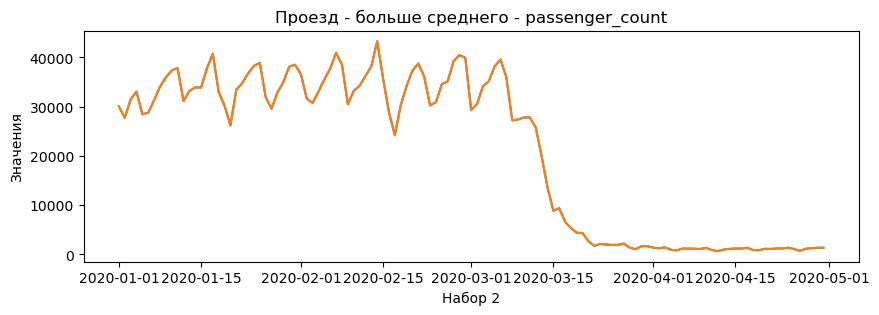

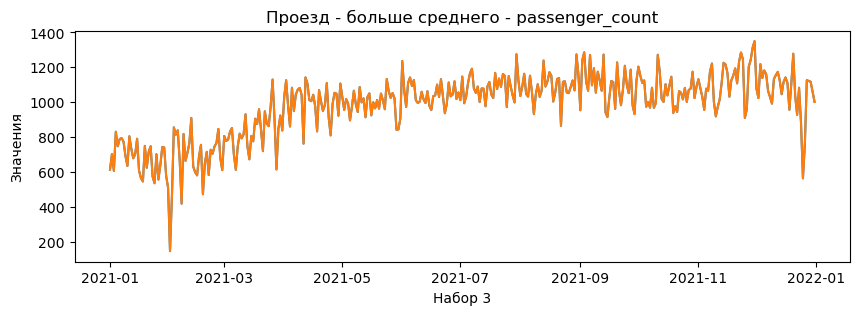

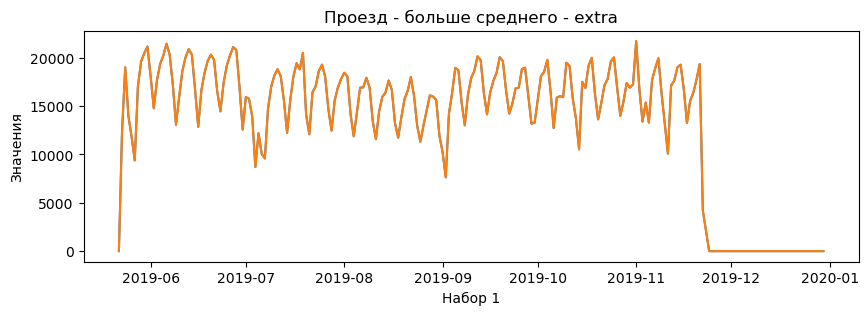

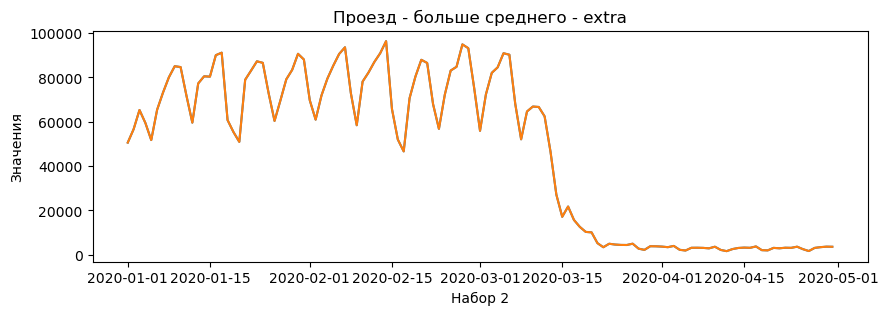

...

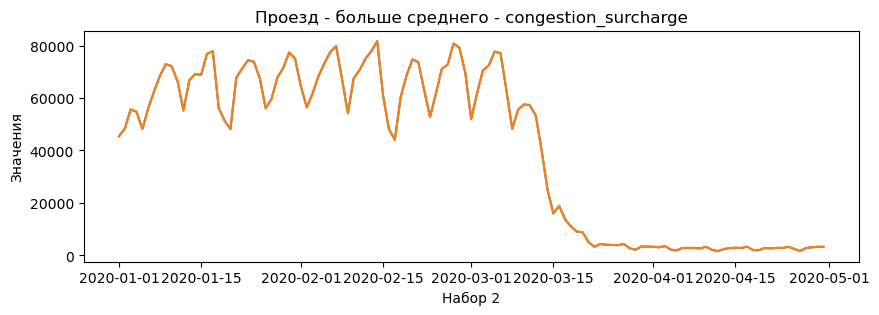

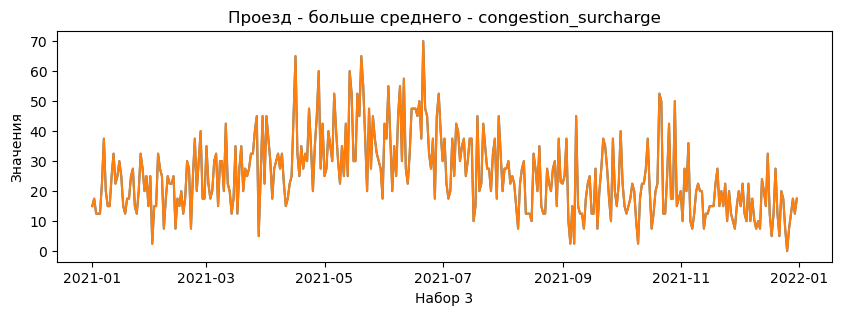

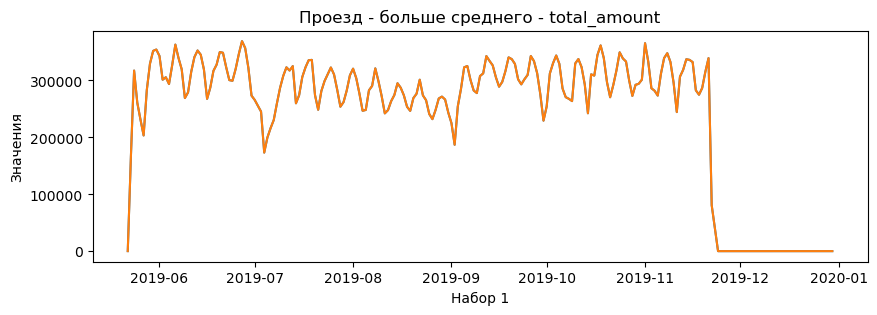

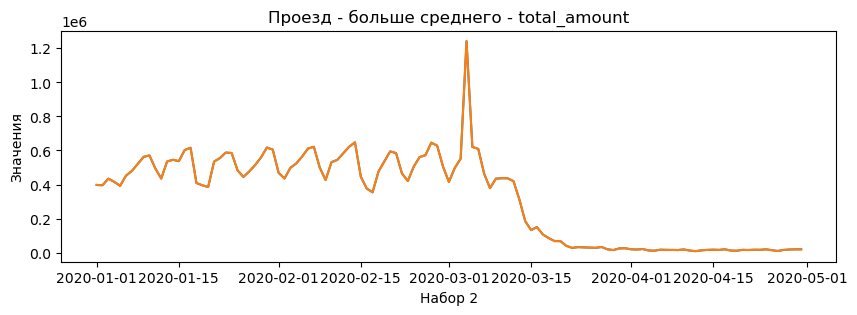

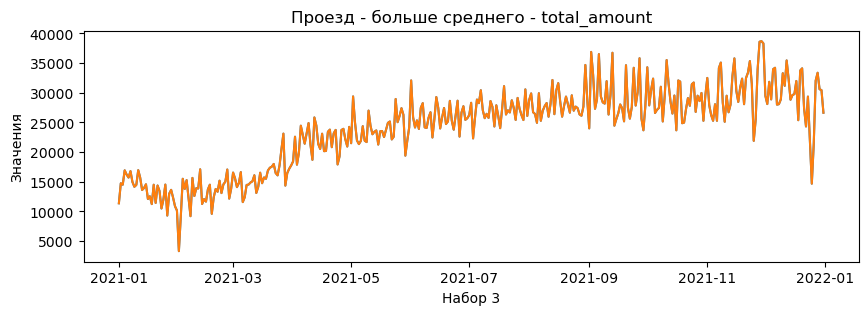

In [49]:
output_graph_pattern('Проезд - больше среднего')

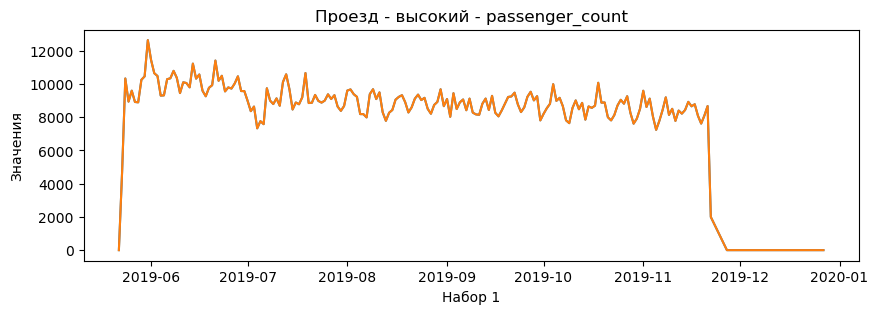

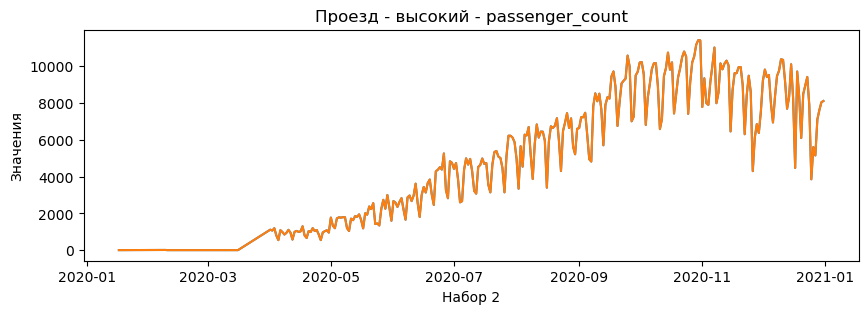

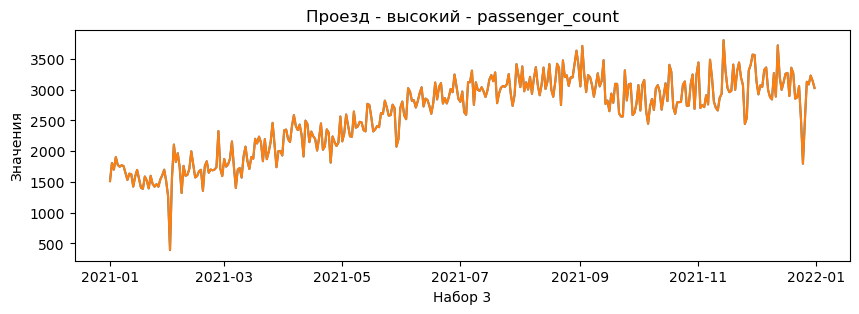

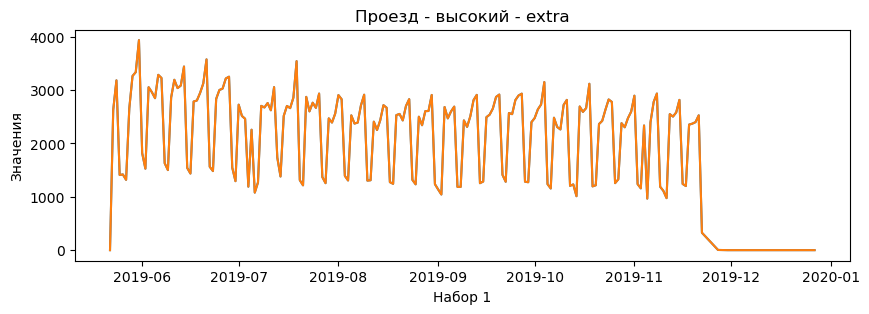

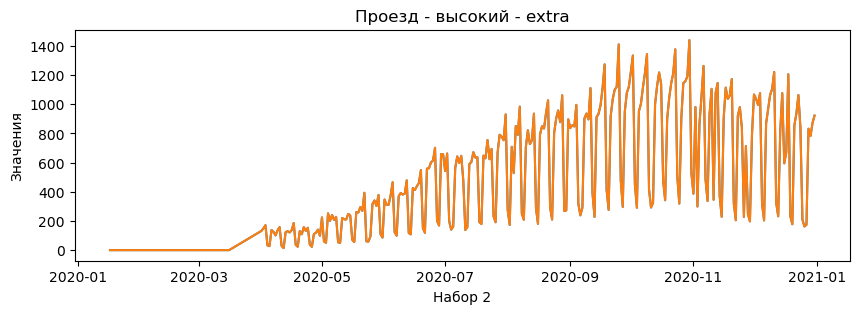

...

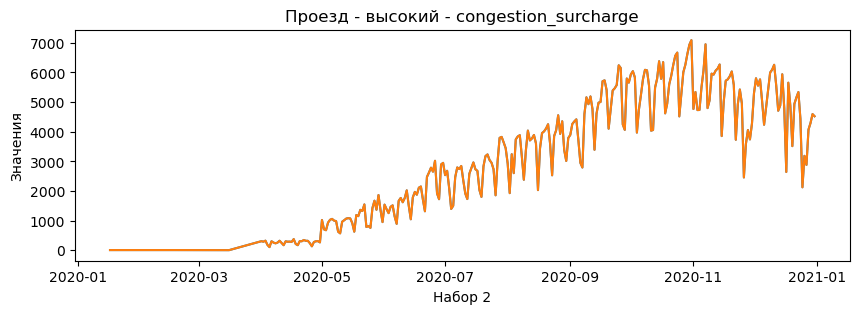

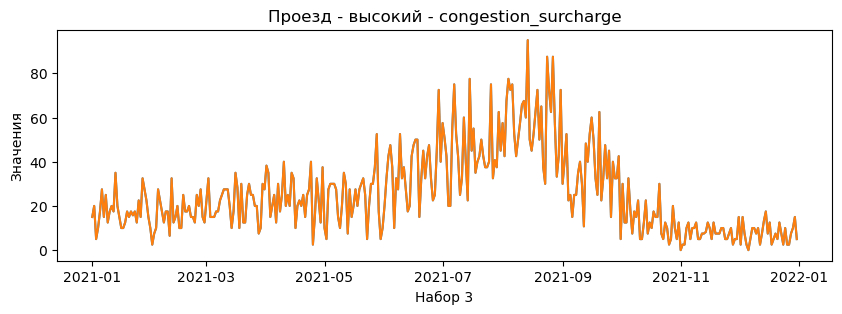

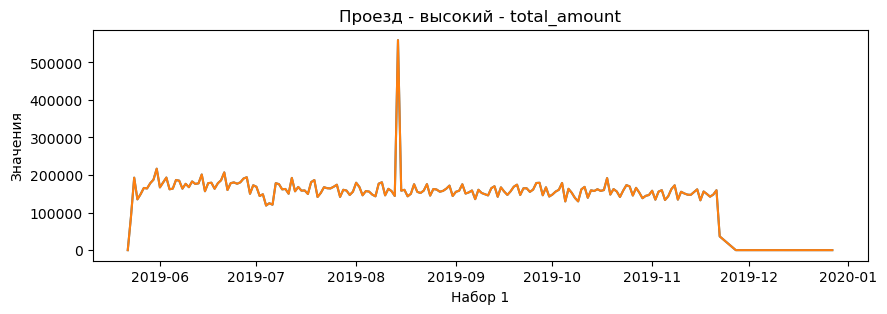

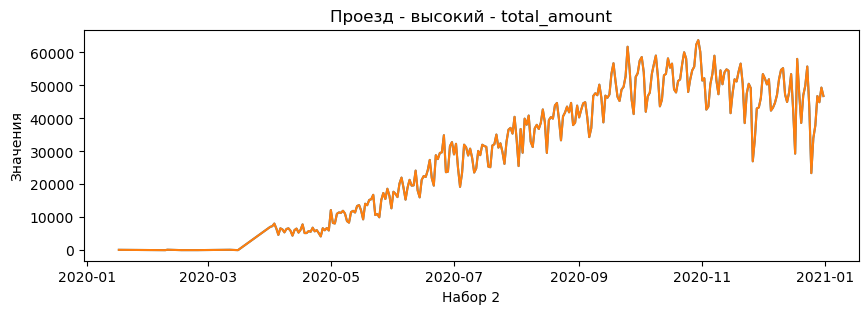

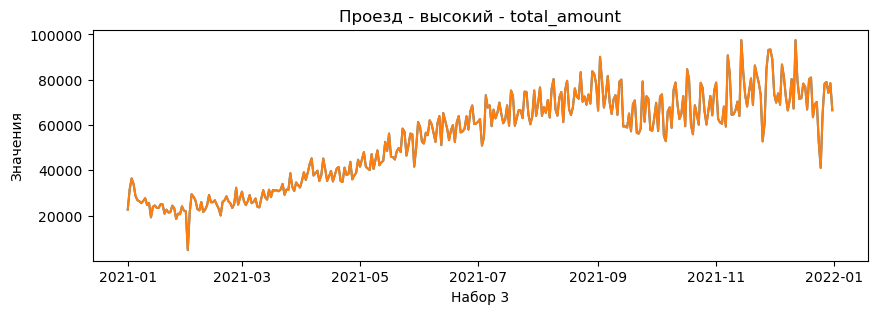

In [50]:
output_graph_pattern('Проезд - высокий')

Закономерности прослеживаются в 'trip_distance','fare_amount'

## 3.2 Визуализация закономерностей

In [51]:
def graf_line_corr_seasonal(column, clust):
    for i in range(len(lst_df)):
        df_ = lst_df[i].loc[lst_df[i]['name_cluster'] == clust, column]
        df = pd.DataFrame(df_.groupby(df_.index).sum())
        # Линейный график
        plt.figure(figsize=(10, 4))
        df[column].plot(marker='o', color='b', linestyle='-')
        plt.title(f'Динамика изменения временного ряда {column}, набор {i+1}, кластер {clust}')
        plt.xlabel('Дата')
        plt.ylabel(column)
        plt.grid(True)
        plt.show()
        
        # График автокорреляции
        import statsmodels.api as sm
        plt.figure(figsize=(10, 4))
        sm.graphics.tsa.plot_acf(df[column], lags=12)
        plt.title(f'График автокорреляции {column}, набор {i+1}, кластер {clust}')
        plt.xlabel('Лаг')
        plt.ylabel('Коэффициент корреляции')
        plt.grid(True)
        plt.show()
        
        # Разложение на компоненты
        result = seasonal_decompose(df[column], model='additive', period=12)
        
        plt.figure(figsize=(10, 8))
        result.plot()
        plt.title(f'Разложение временного ряда {column} на компоненты, набор {i+1}, кластер {clust}')
        plt.xlabel('Дата')
        plt.ylabel(column)
        plt.show()

        # Скользящее среднее за 12 месяцев
        df = df[column]
        plt.figure(figsize = (10, 4))
        plt.plot(df, label = 'Данные по месяцам', color = 'steelblue')
        plt.plot(df.rolling(window = 12).mean(), label = 'Скользящее среднее за 12 месяцев', color = 'orange')
        plt.legend(title = '', loc = 'upper left')
        plt.xlabel('Месяцы')
        plt.ylabel(column)
        plt.title(f'Скользящее среднее {column}, набор {i+1}, кластер {clust}')
        plt.show()


        # from sktime.utils.plotting import plot_series

### Визуализация закономерности trip_distance

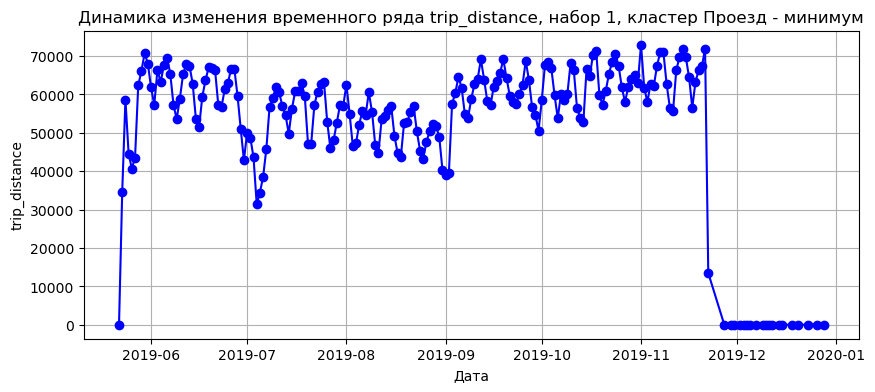

<Figure size 1000x400 with 0 Axes>

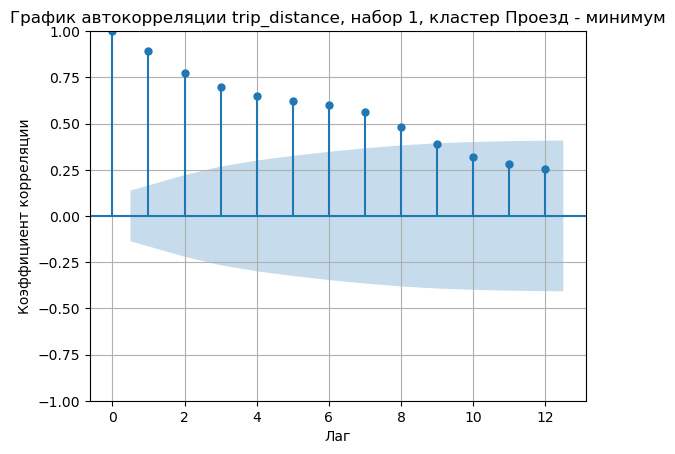

<Figure size 1000x800 with 0 Axes>

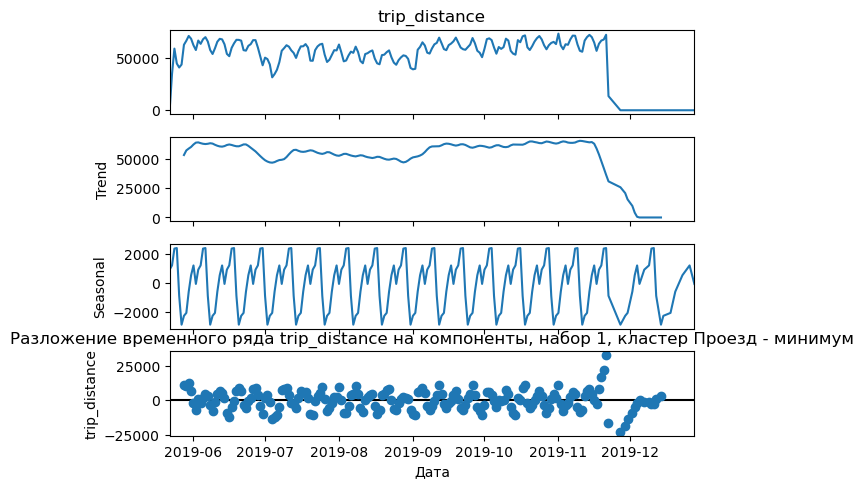

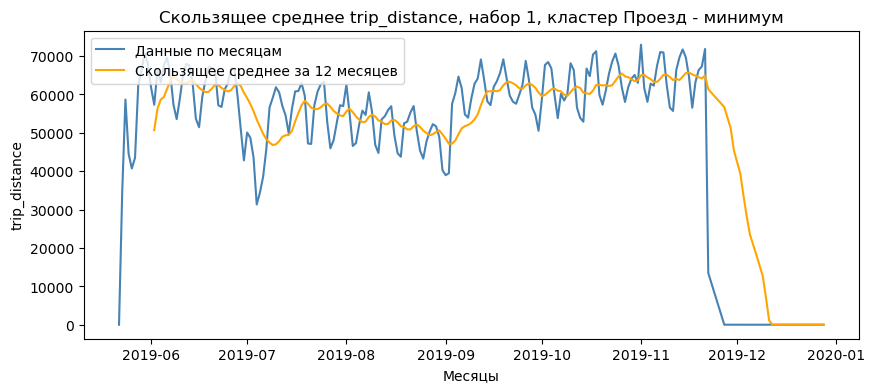

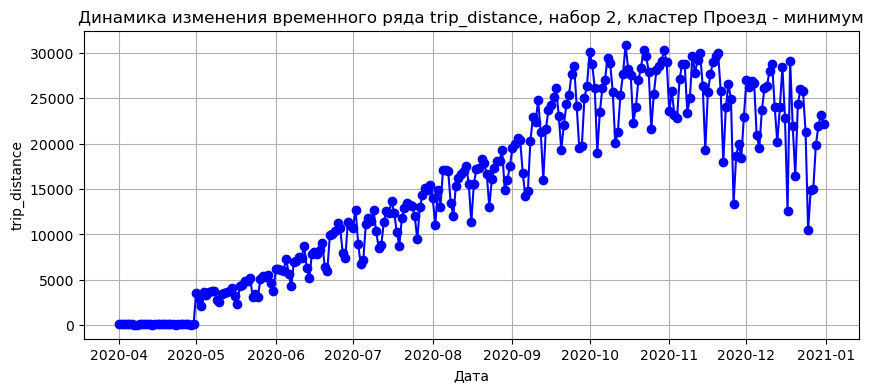

<Figure size 1000x400 with 0 Axes>

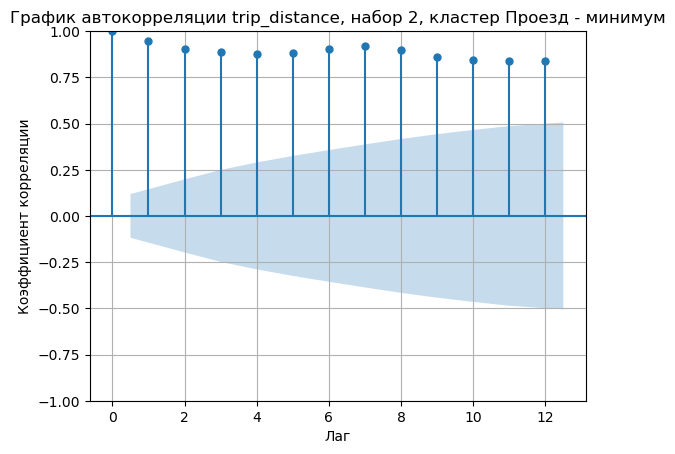

<Figure size 1000x800 with 0 Axes>

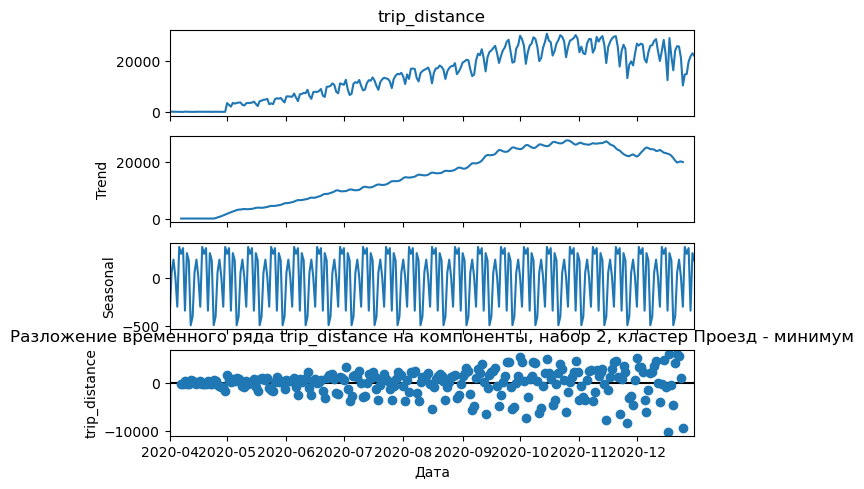

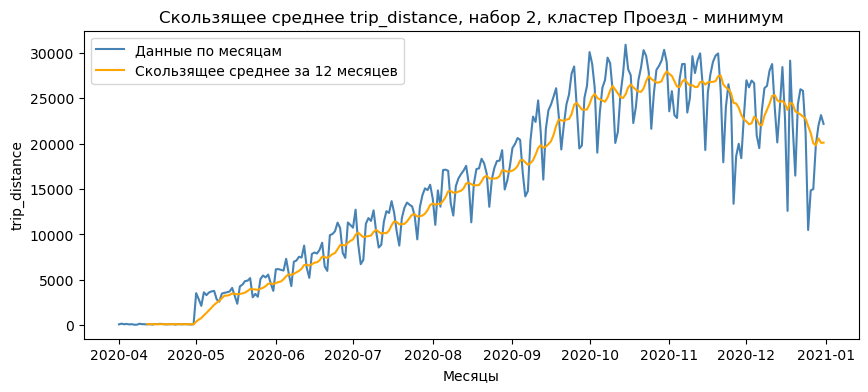

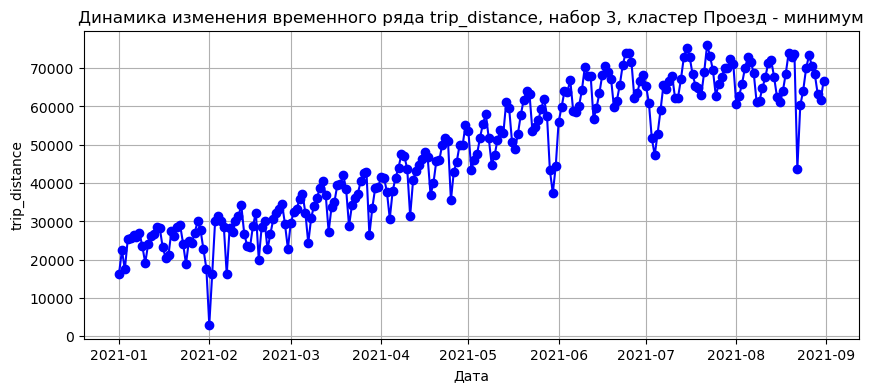

<Figure size 1000x400 with 0 Axes>

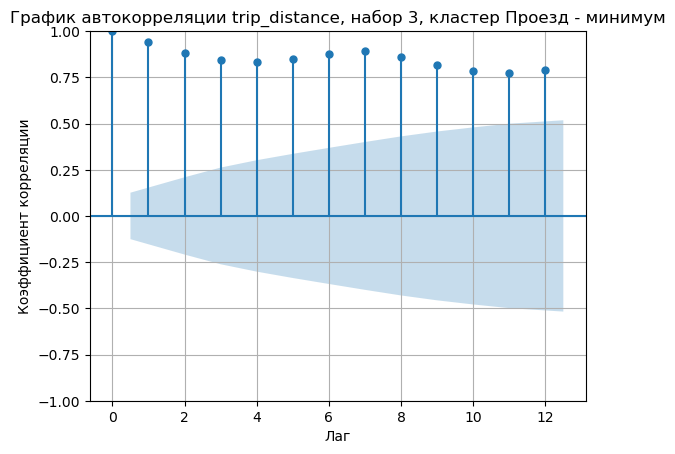

<Figure size 1000x800 with 0 Axes>

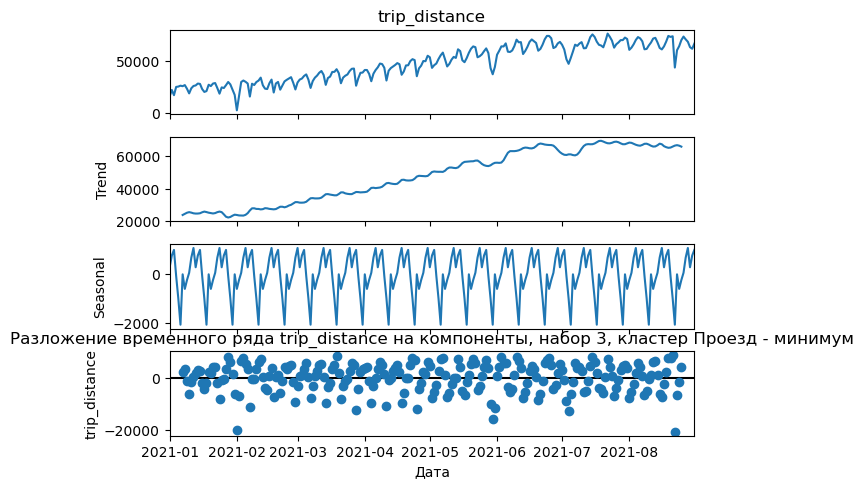

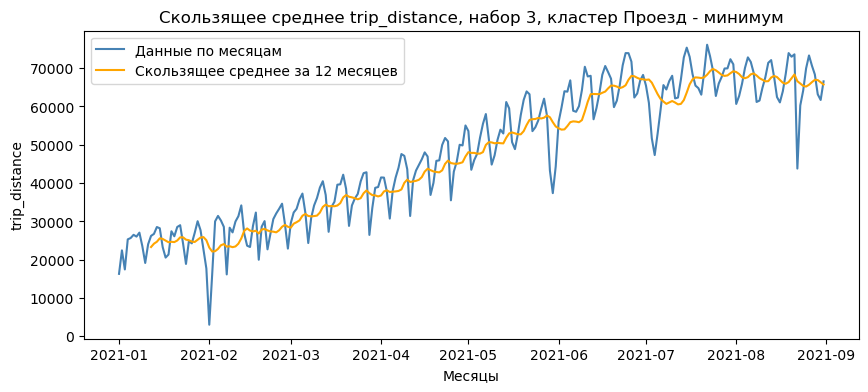

In [52]:
graf_line_corr_seasonal('trip_distance', 'Проезд - минимум')

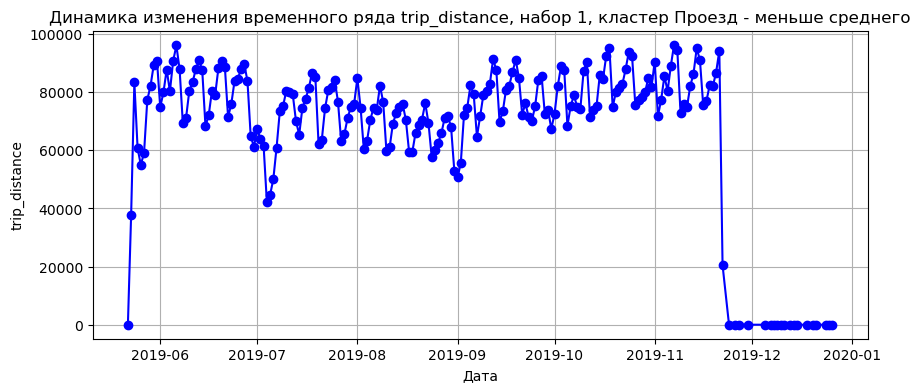

<Figure size 1000x400 with 0 Axes>

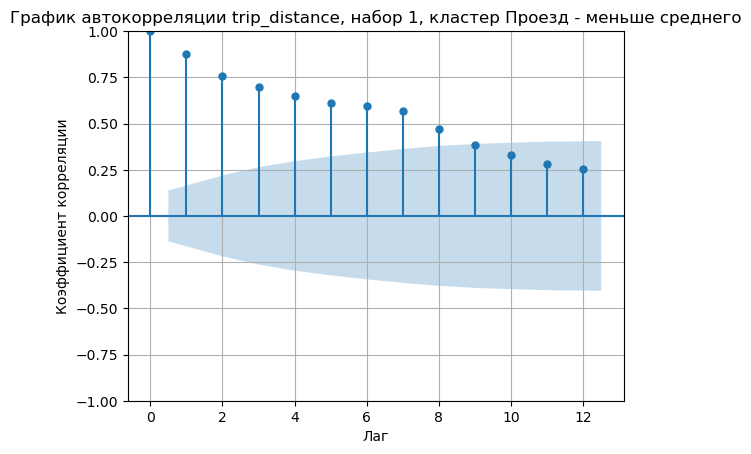

<Figure size 1000x800 with 0 Axes>

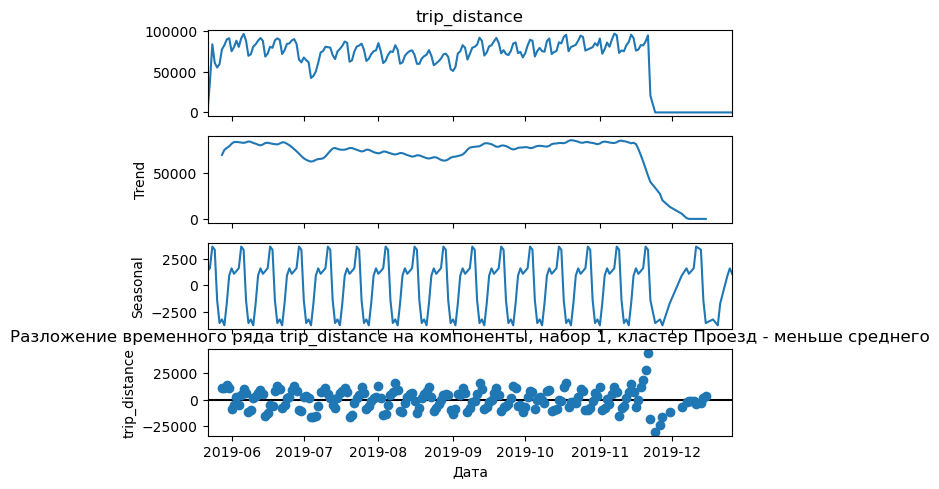

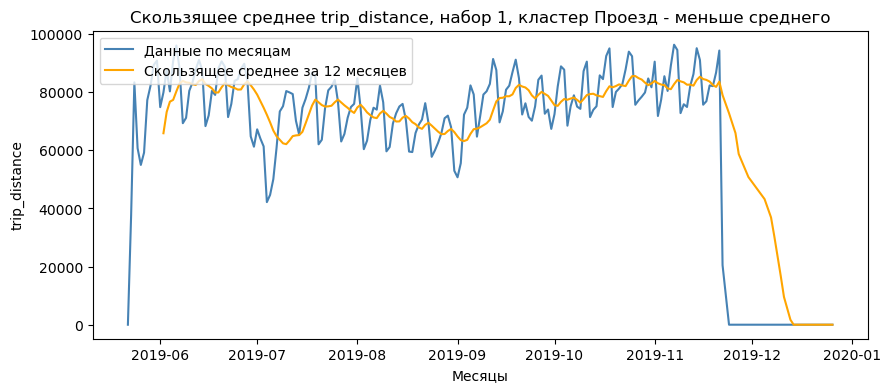

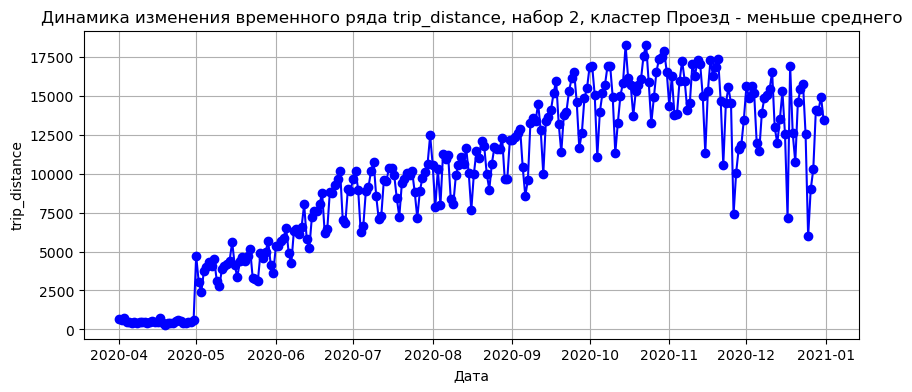

<Figure size 1000x400 with 0 Axes>

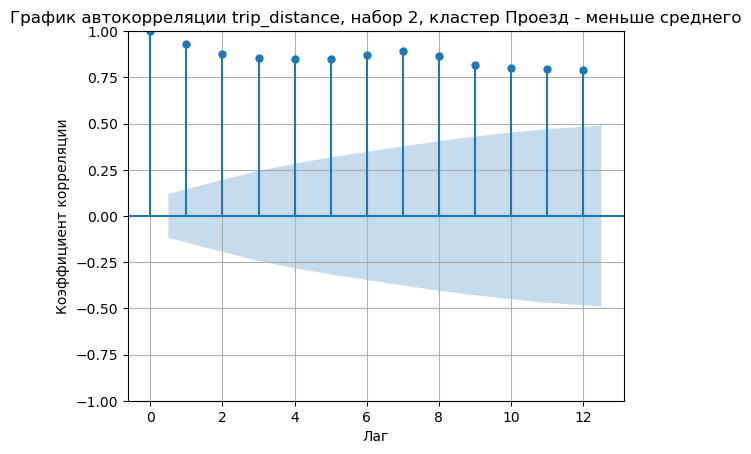

<Figure size 1000x800 with 0 Axes>

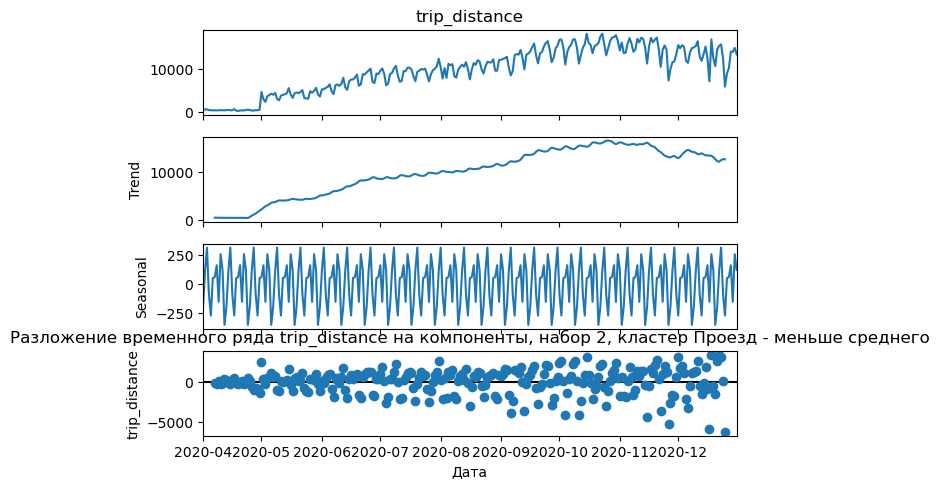

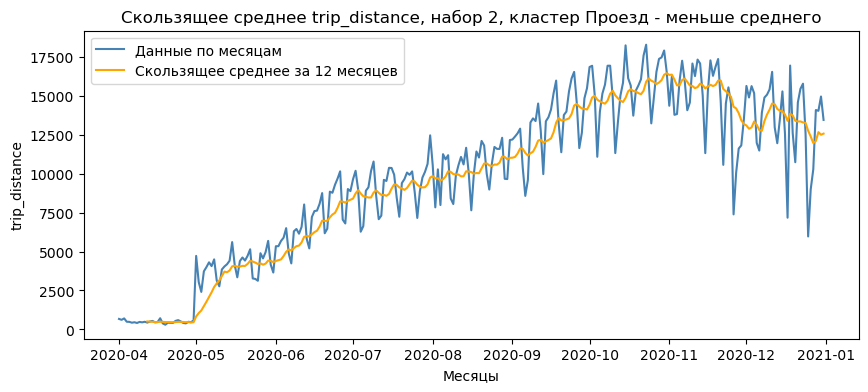

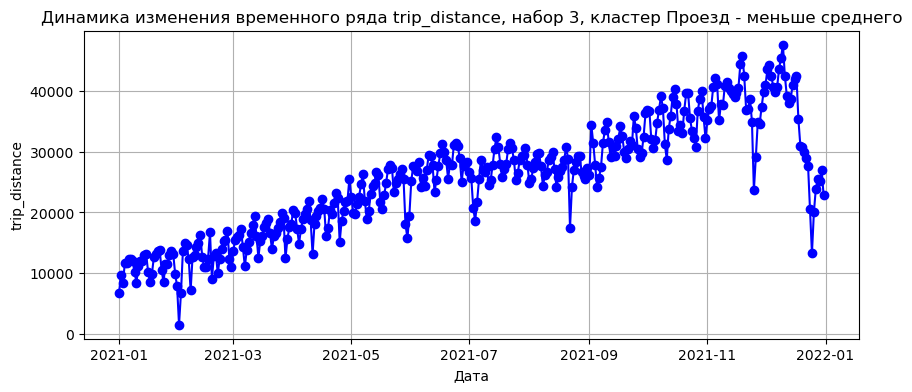

<Figure size 1000x400 with 0 Axes>

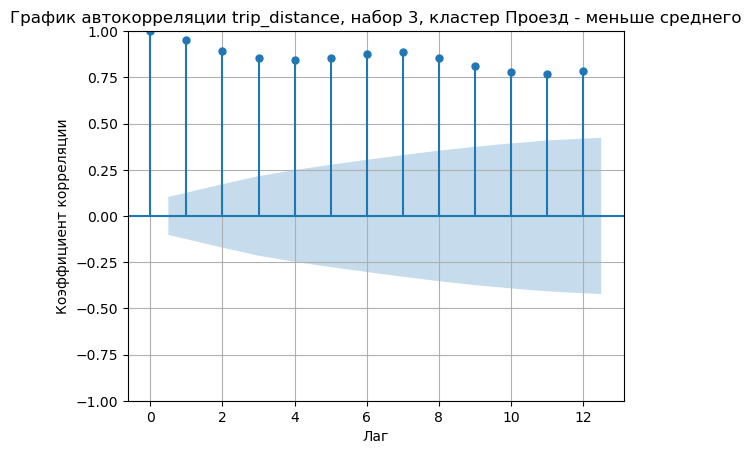

<Figure size 1000x800 with 0 Axes>

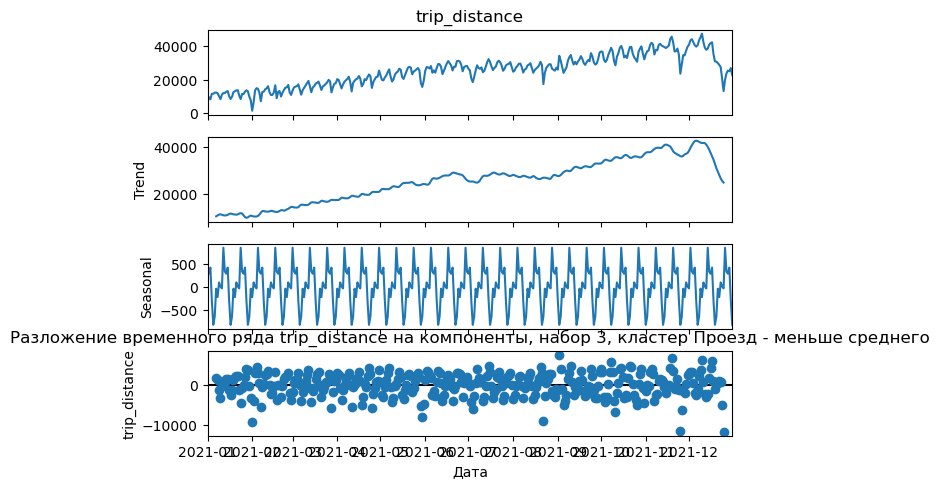

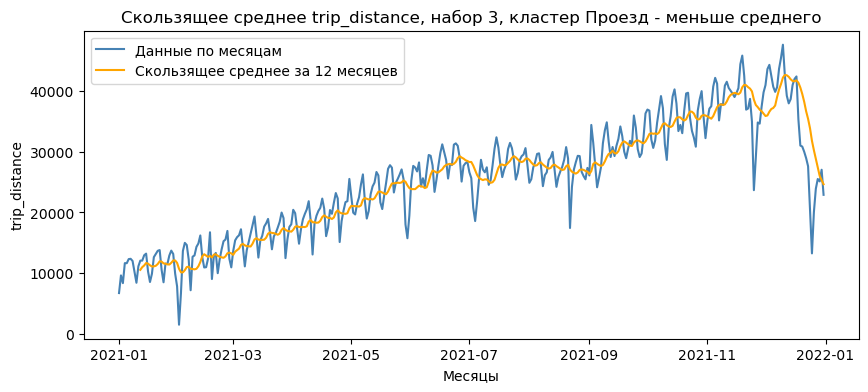

In [53]:
graf_line_corr_seasonal('trip_distance', 'Проезд - меньше среднего')

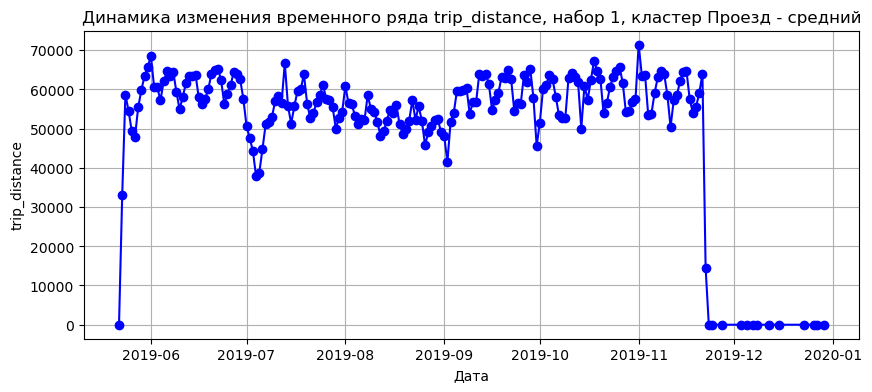

<Figure size 1000x400 with 0 Axes>

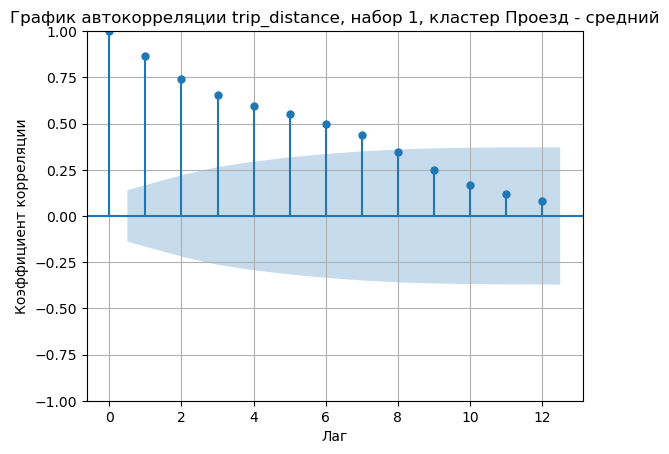

<Figure size 1000x800 with 0 Axes>

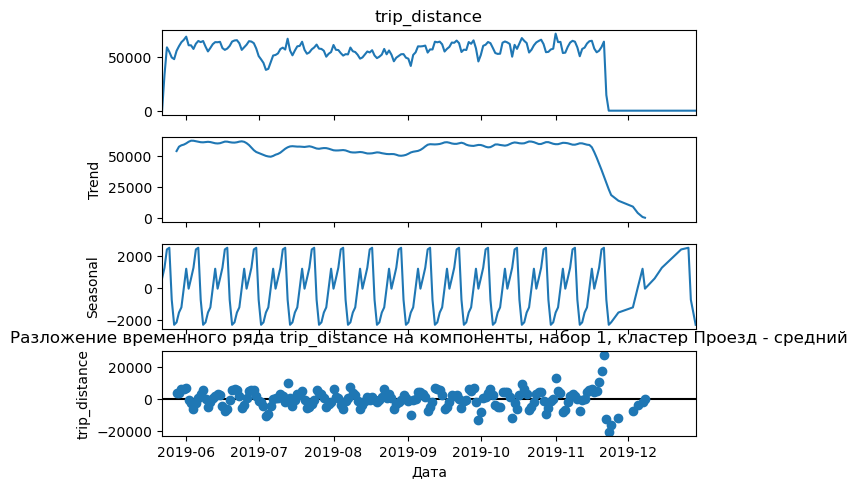

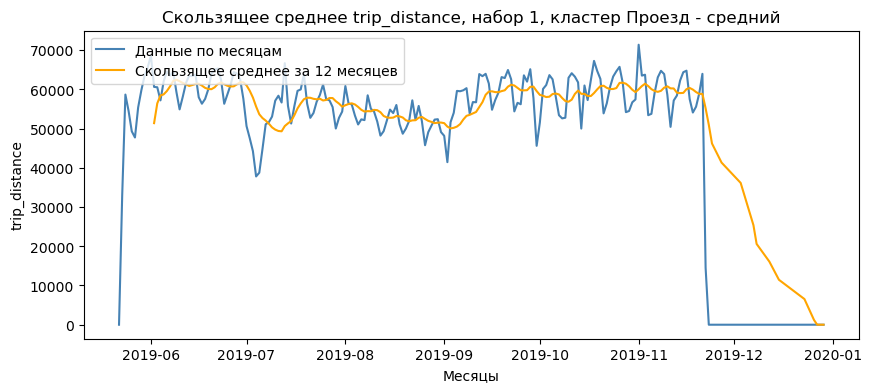

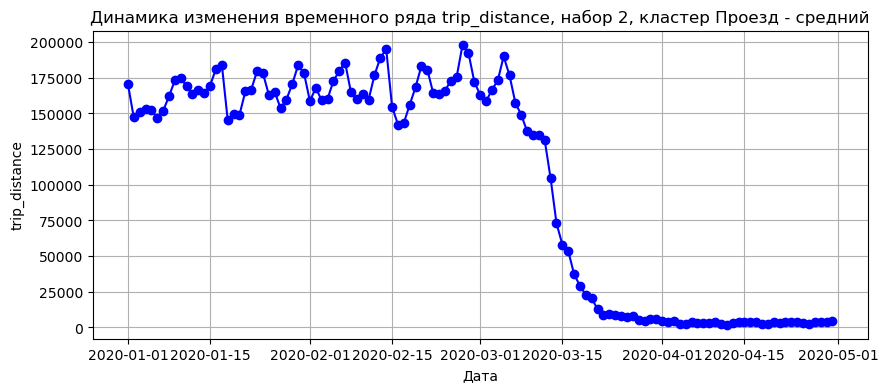

<Figure size 1000x400 with 0 Axes>

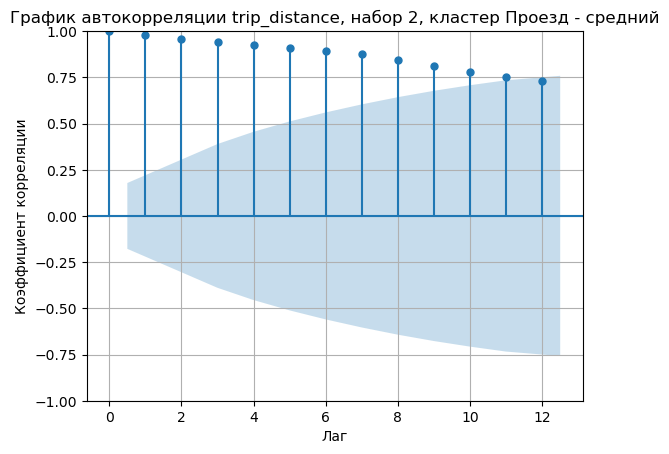

<Figure size 1000x800 with 0 Axes>

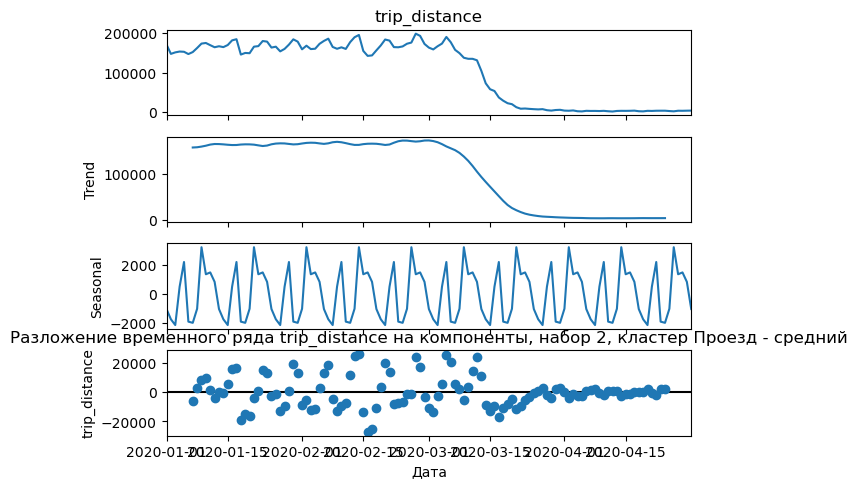

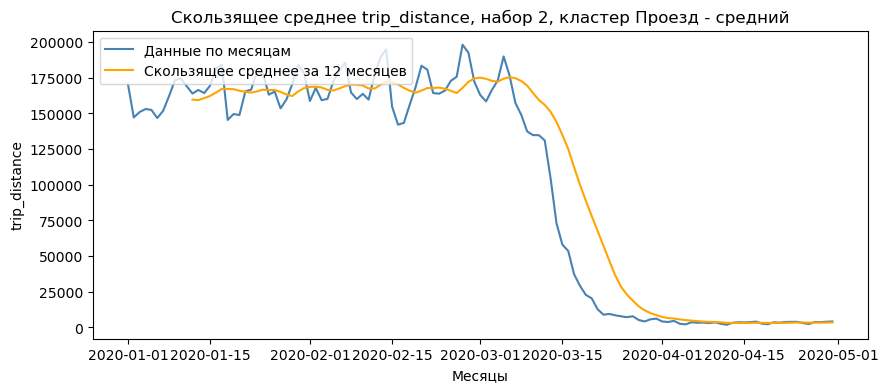

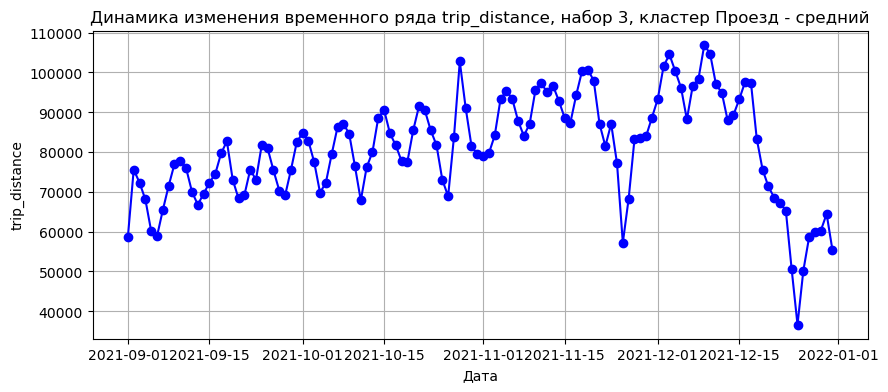

<Figure size 1000x400 with 0 Axes>

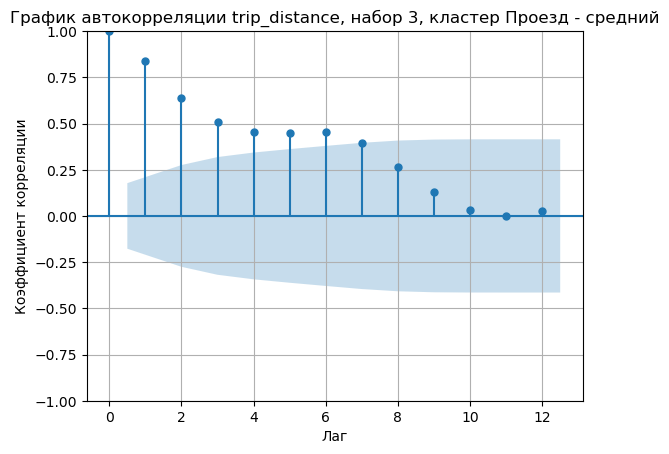

<Figure size 1000x800 with 0 Axes>

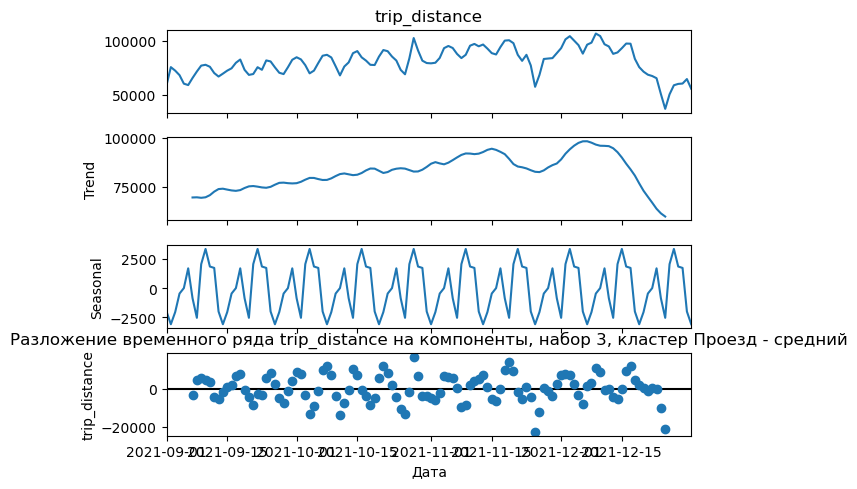

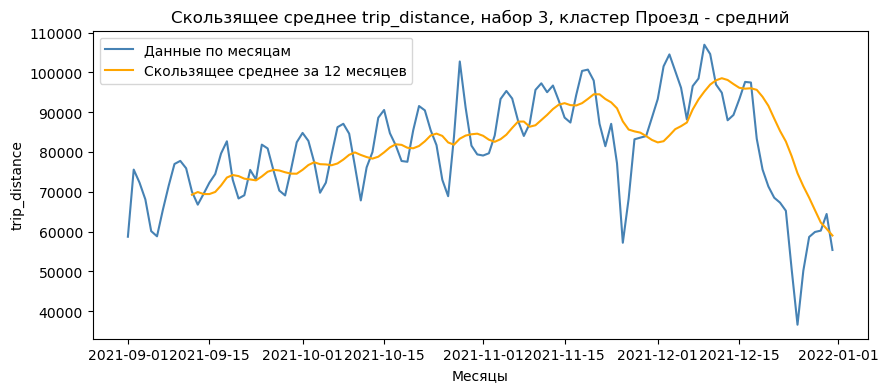

In [54]:
graf_line_corr_seasonal('trip_distance', 'Проезд - средний')

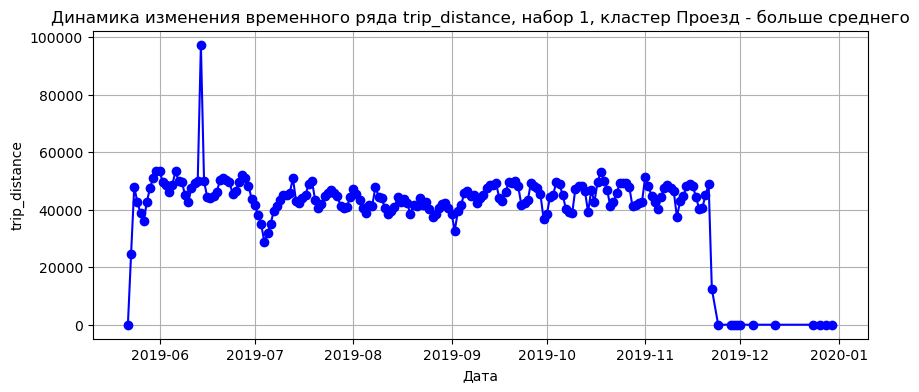

<Figure size 1000x400 with 0 Axes>

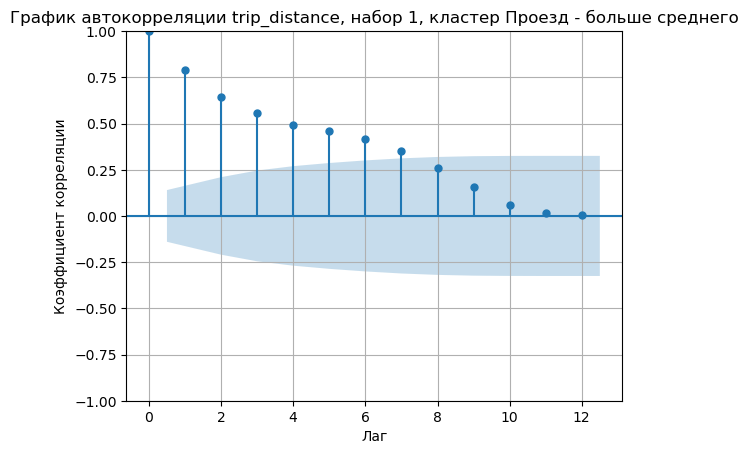

<Figure size 1000x800 with 0 Axes>

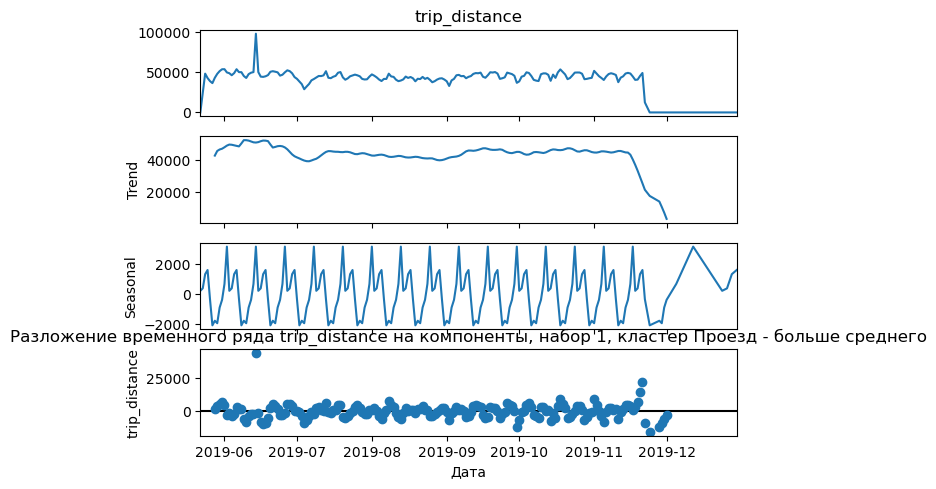

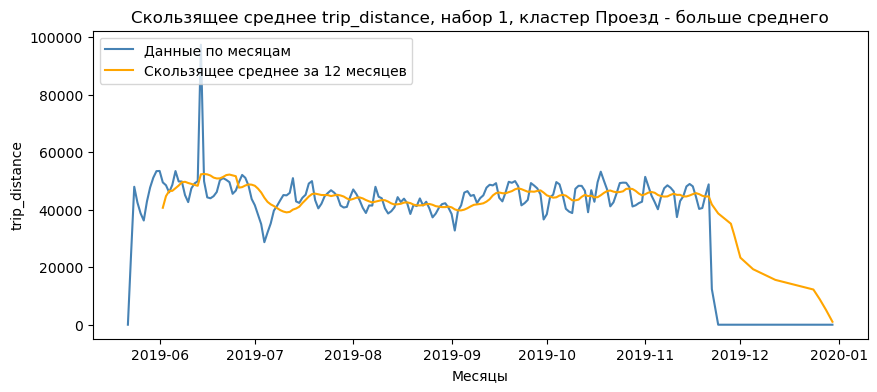

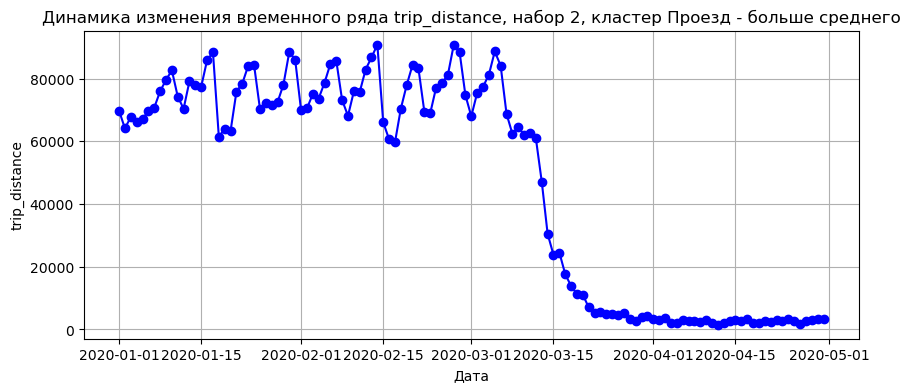

<Figure size 1000x400 with 0 Axes>

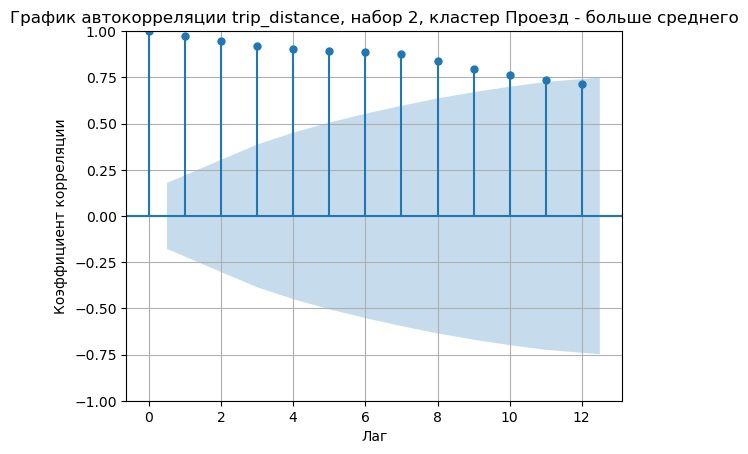

<Figure size 1000x800 with 0 Axes>

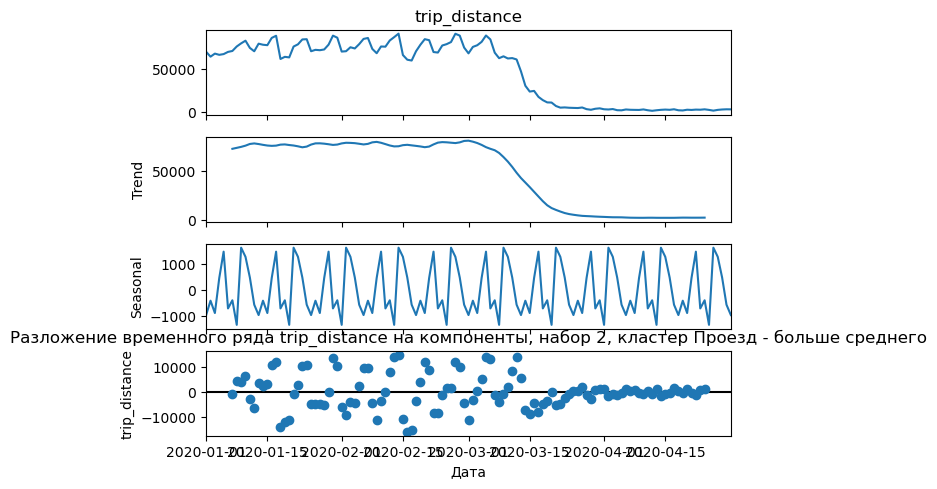

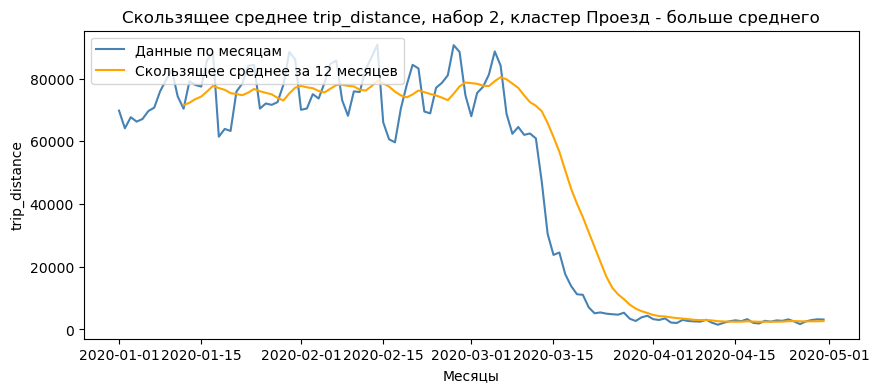

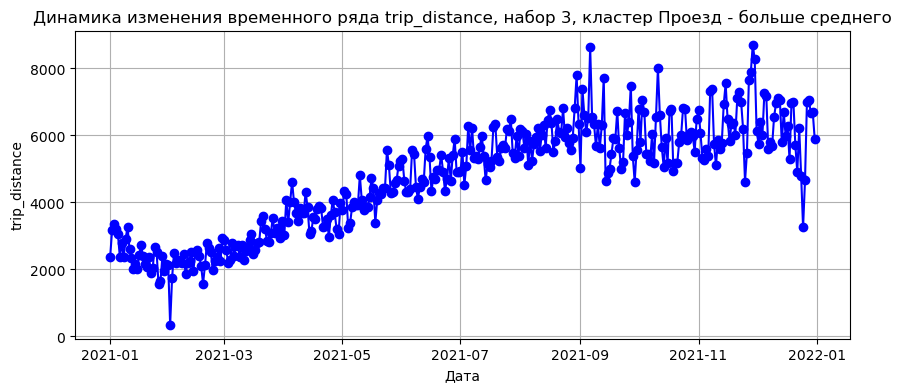

<Figure size 1000x400 with 0 Axes>

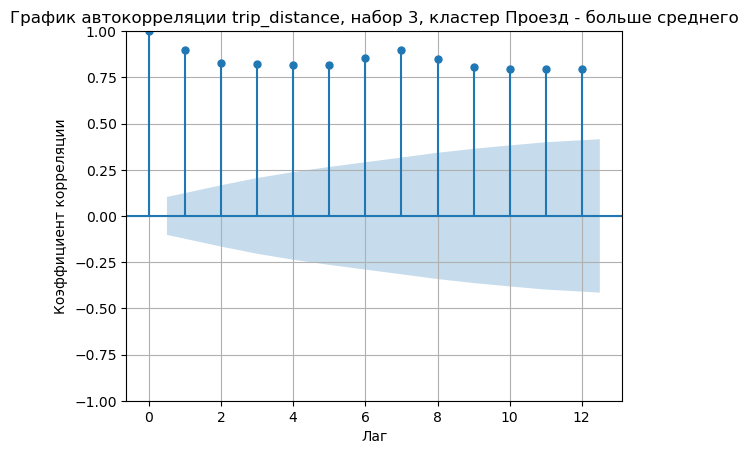

<Figure size 1000x800 with 0 Axes>

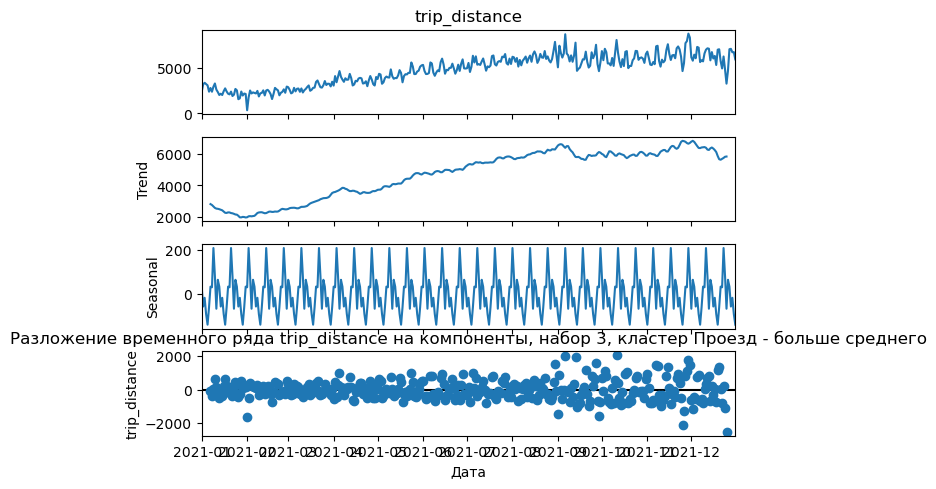

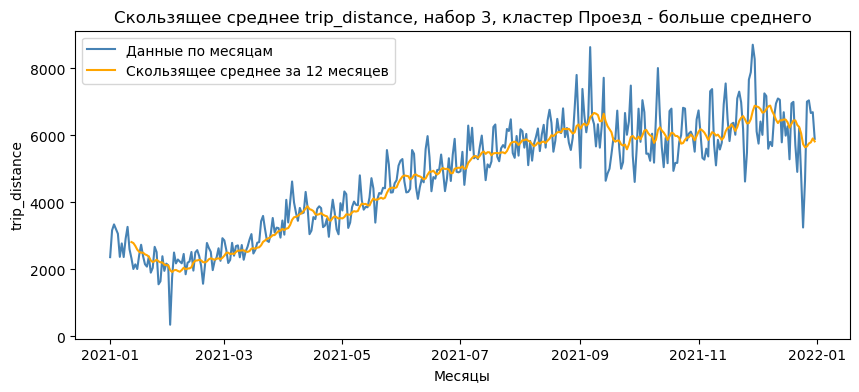

In [55]:
graf_line_corr_seasonal('trip_distance', 'Проезд - больше среднего')

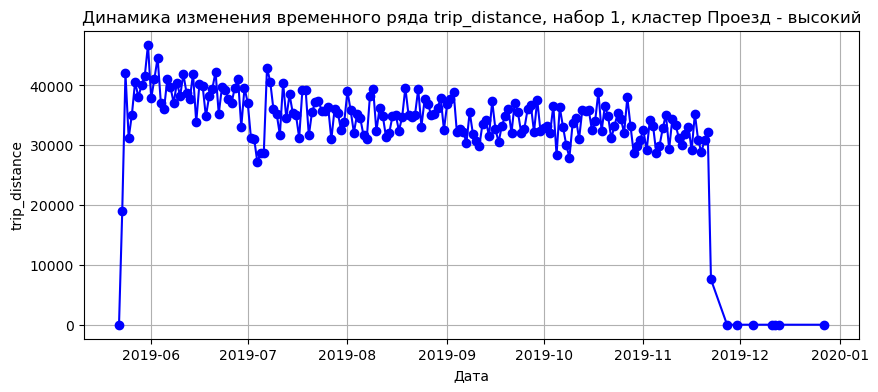

<Figure size 1000x400 with 0 Axes>

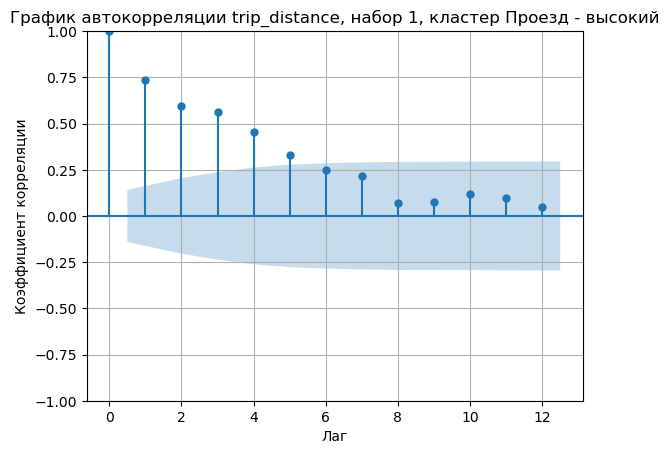

<Figure size 1000x800 with 0 Axes>

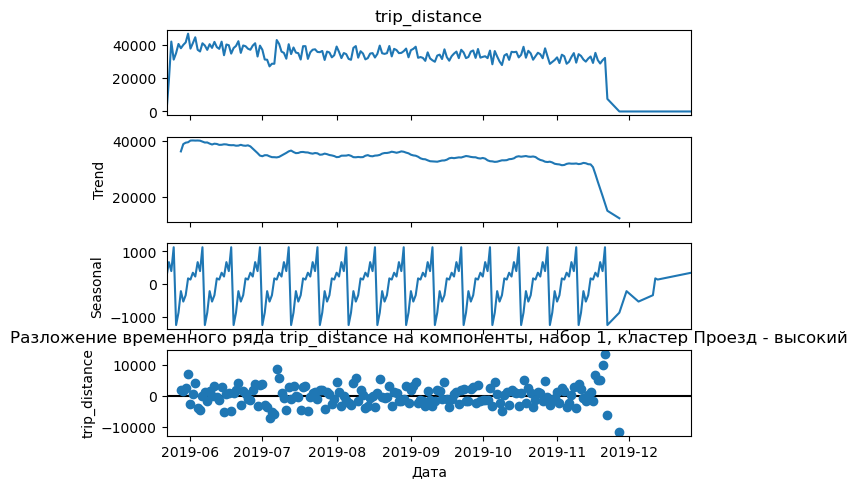

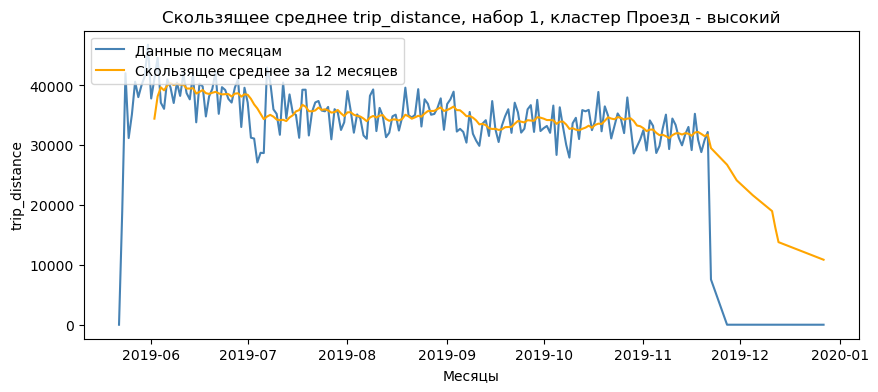

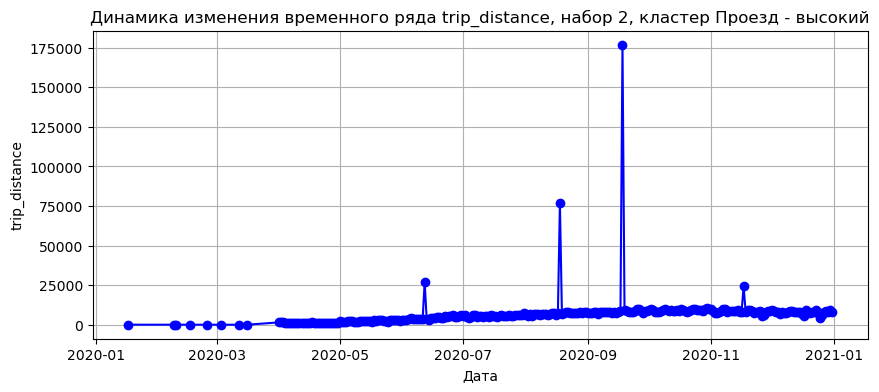

<Figure size 1000x400 with 0 Axes>

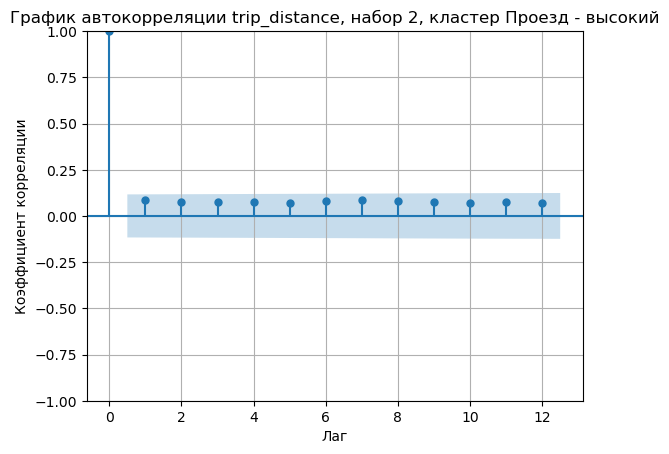

<Figure size 1000x800 with 0 Axes>

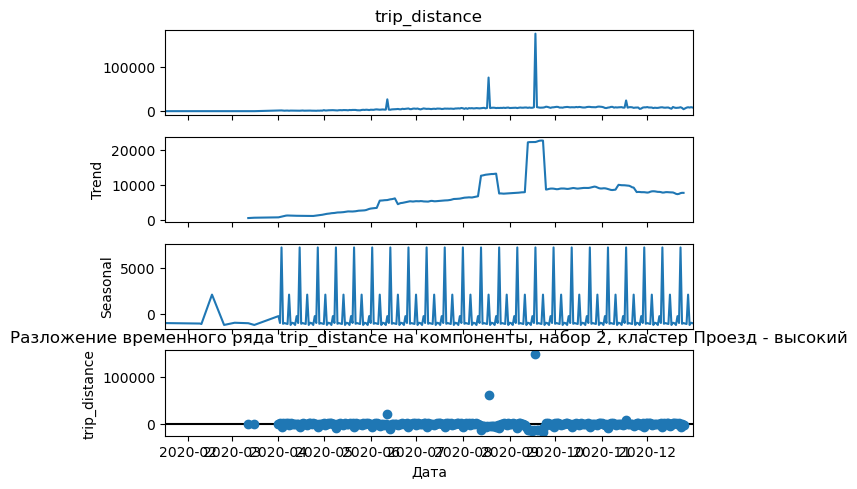

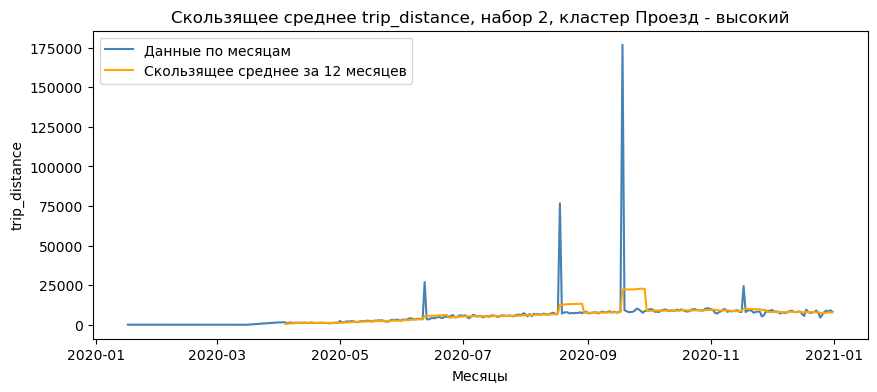

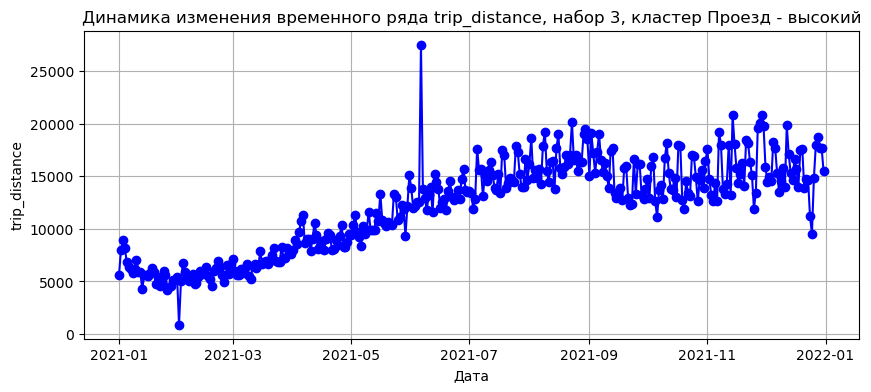

<Figure size 1000x400 with 0 Axes>

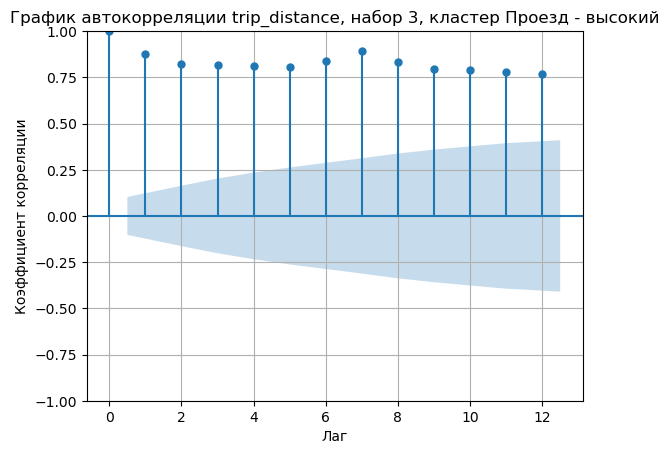

<Figure size 1000x800 with 0 Axes>

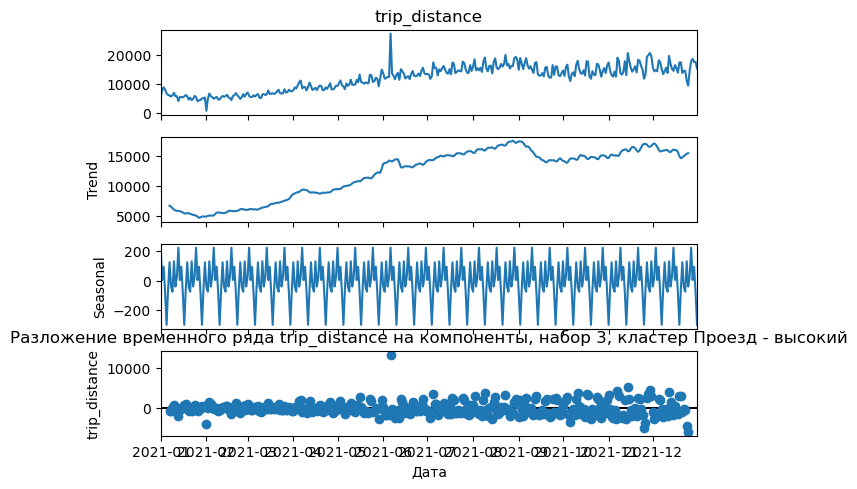

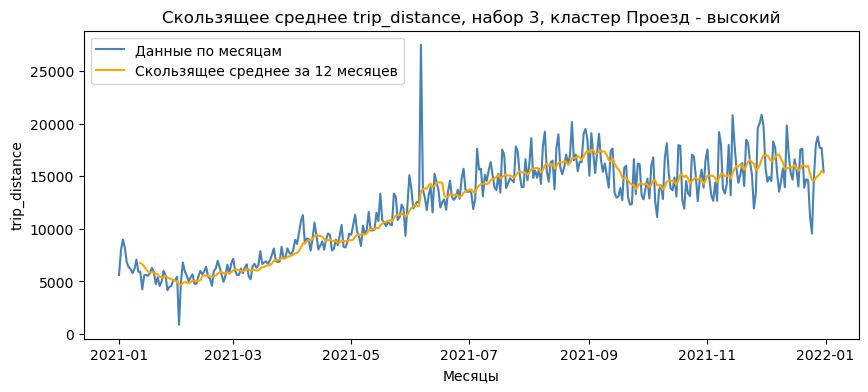

In [56]:
graf_line_corr_seasonal('trip_distance', 'Проезд - высокий')

### Визуализация закономерности fare_amount

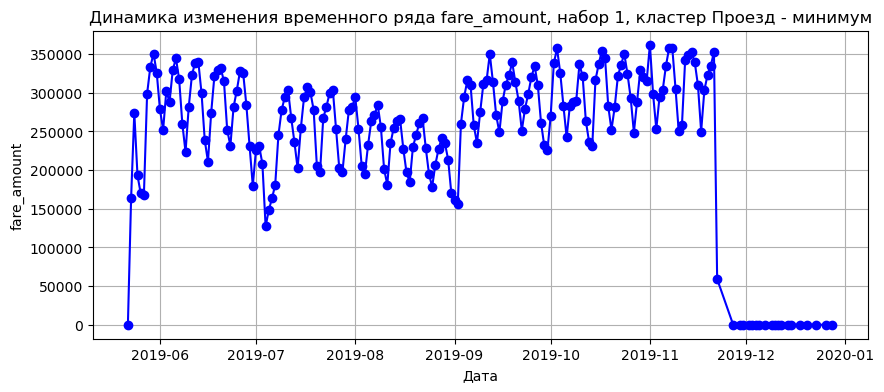

<Figure size 1000x400 with 0 Axes>

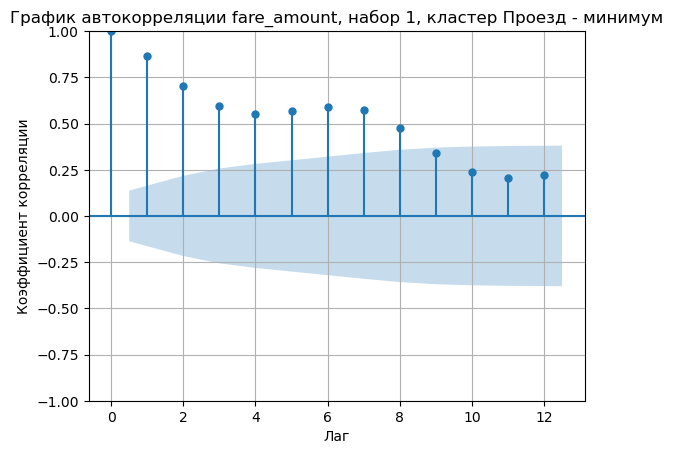

<Figure size 1000x800 with 0 Axes>

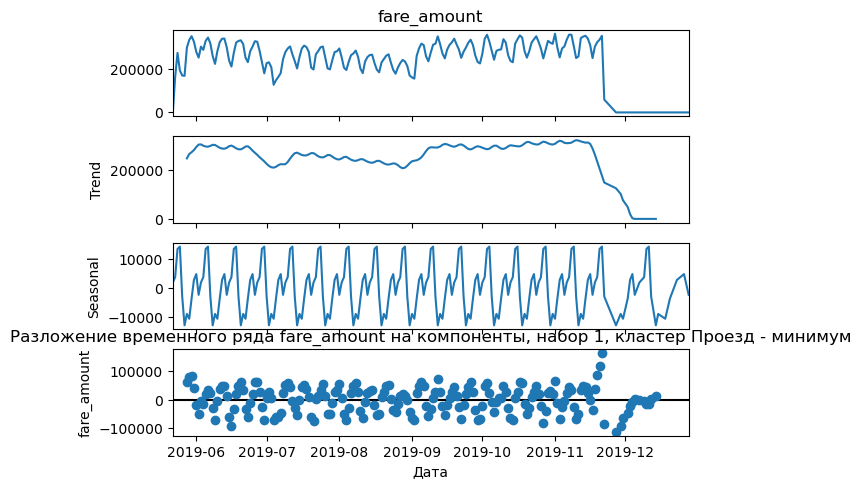

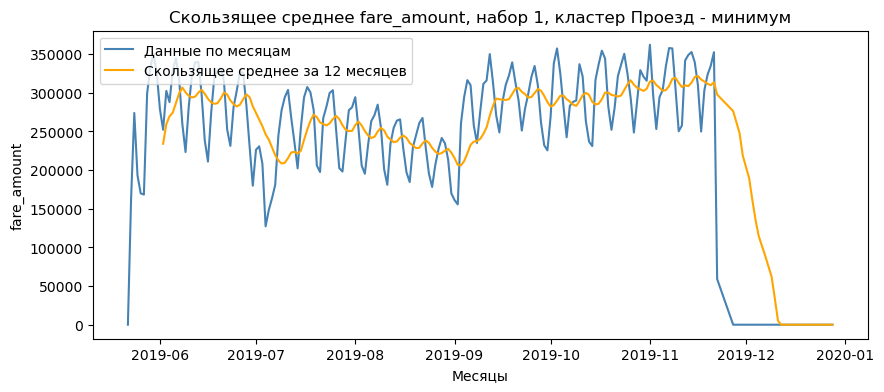

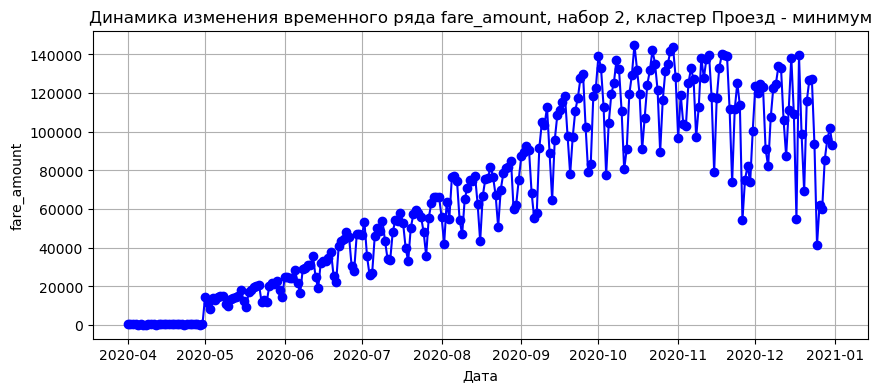

<Figure size 1000x400 with 0 Axes>

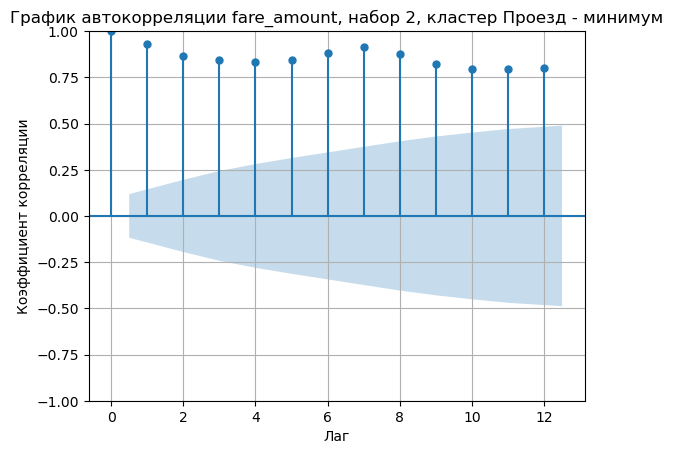

<Figure size 1000x800 with 0 Axes>

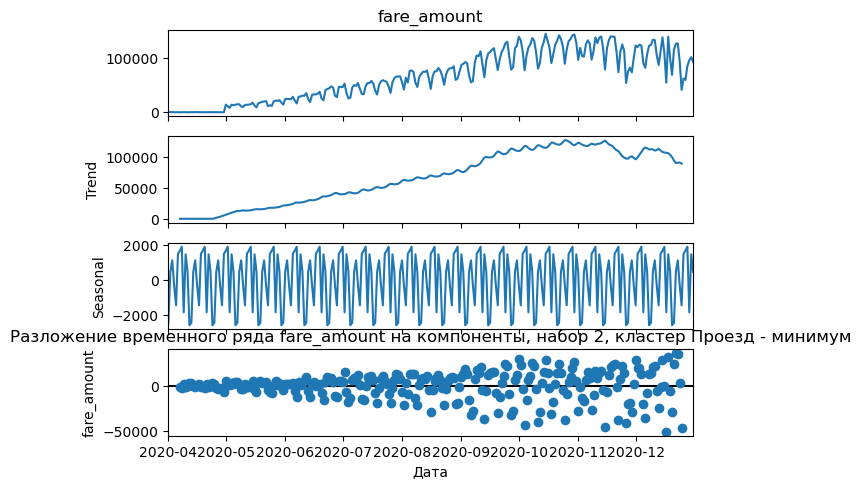

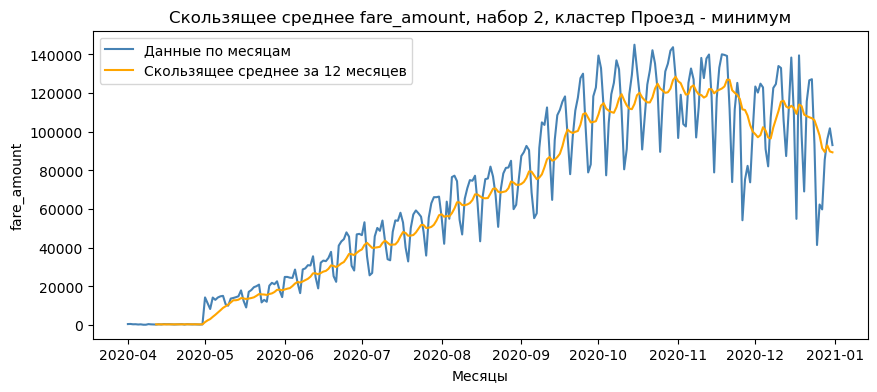

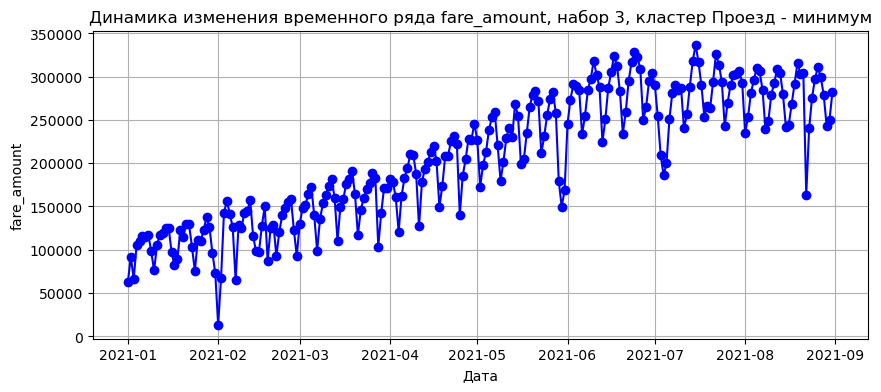

<Figure size 1000x400 with 0 Axes>

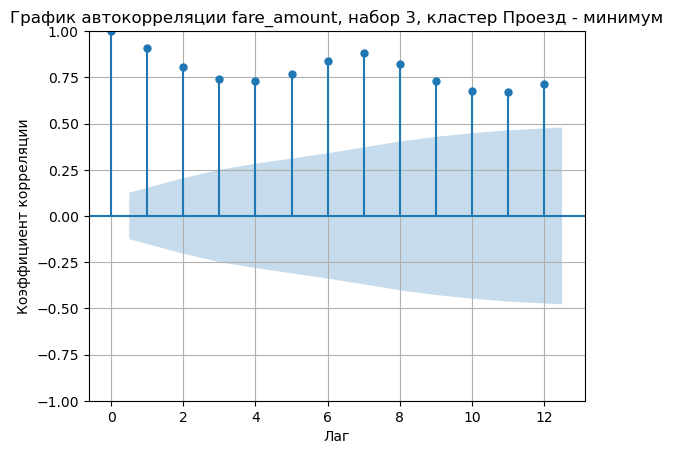

<Figure size 1000x800 with 0 Axes>

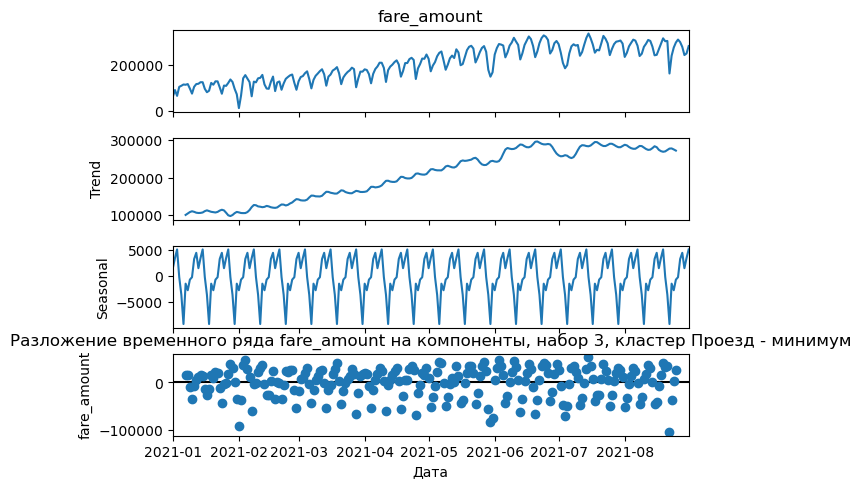

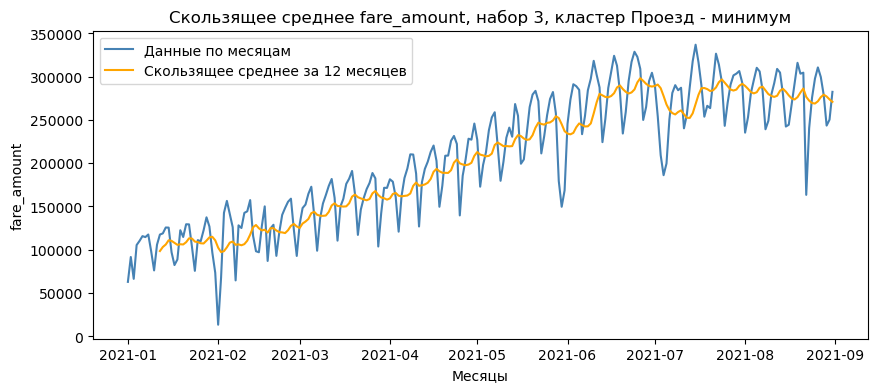

In [57]:
graf_line_corr_seasonal('fare_amount', 'Проезд - минимум')

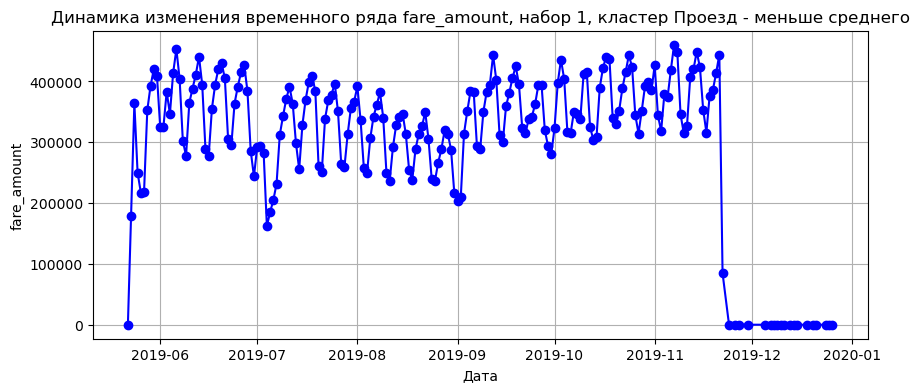

<Figure size 1000x400 with 0 Axes>

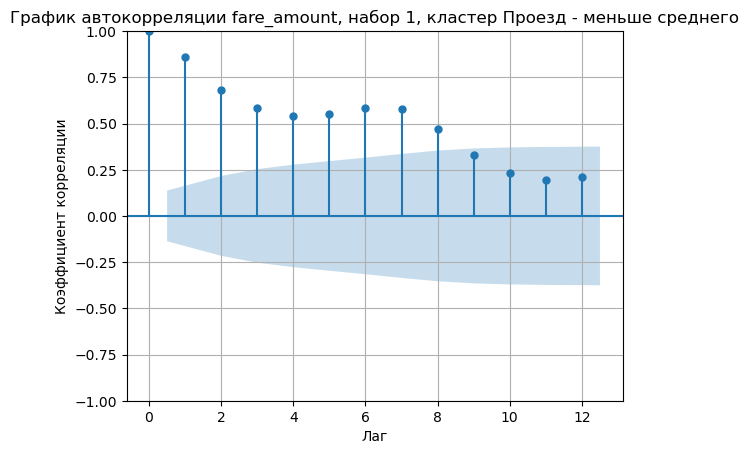

<Figure size 1000x800 with 0 Axes>

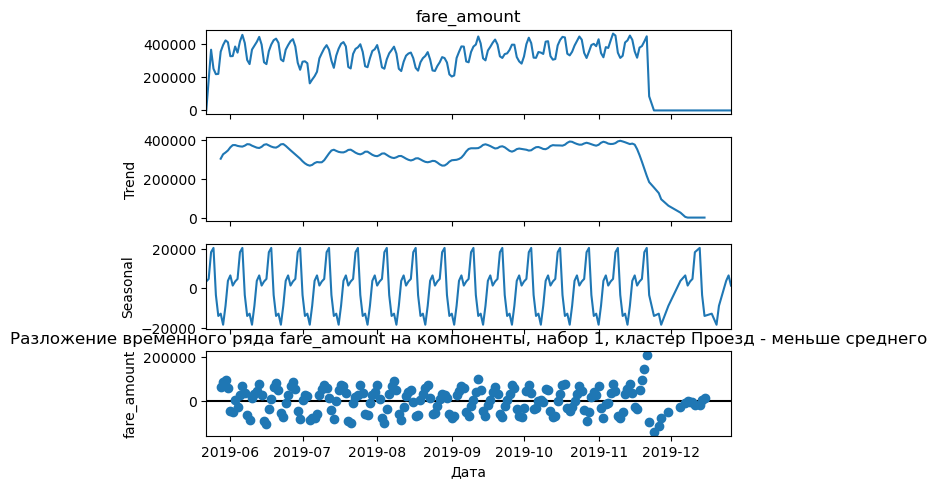

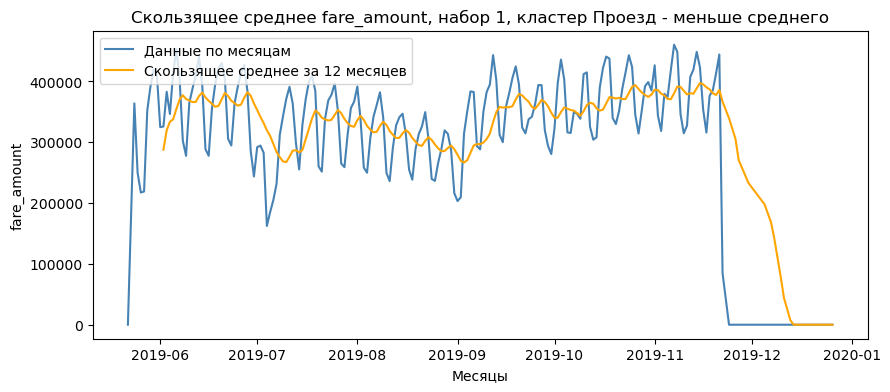

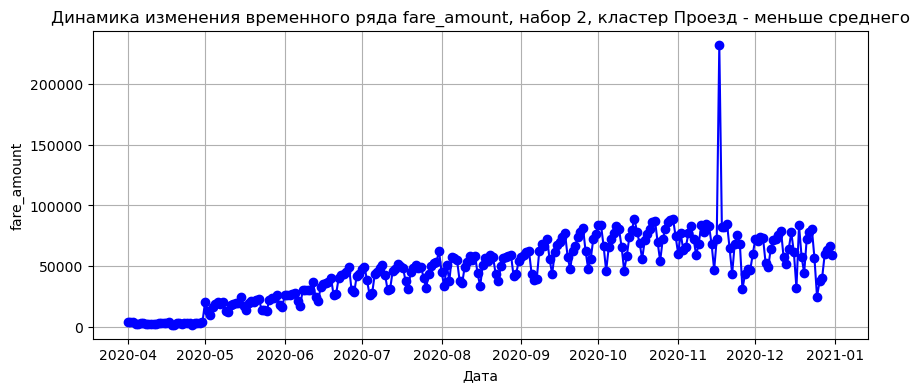

<Figure size 1000x400 with 0 Axes>

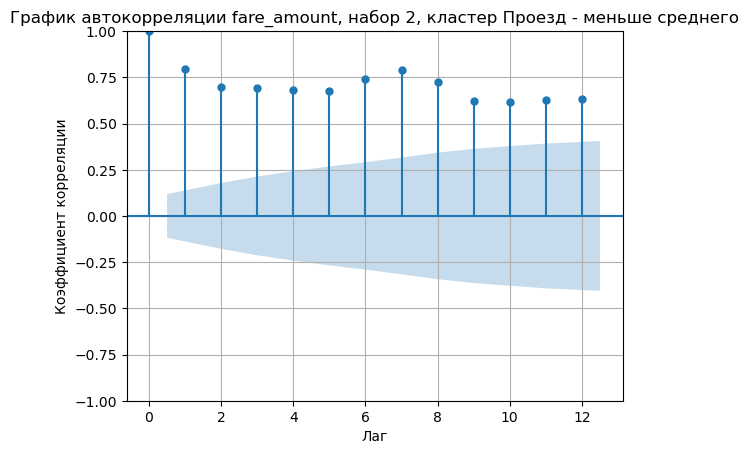

<Figure size 1000x800 with 0 Axes>

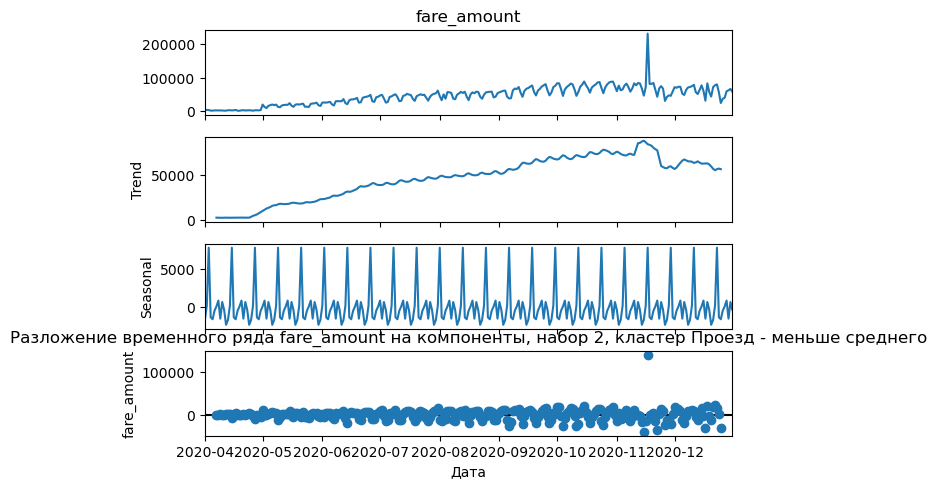

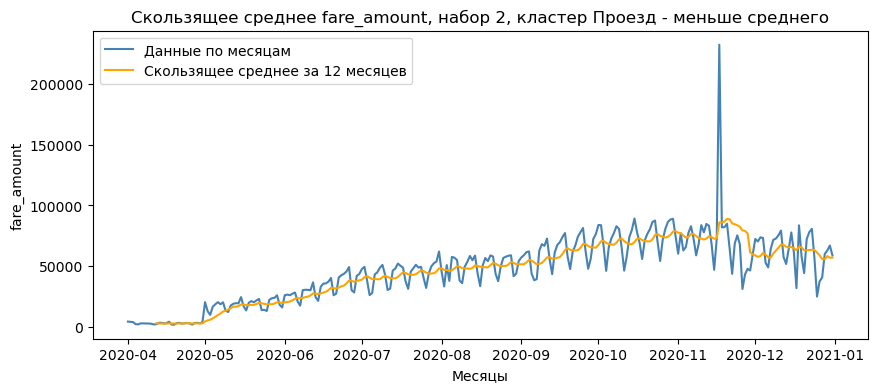

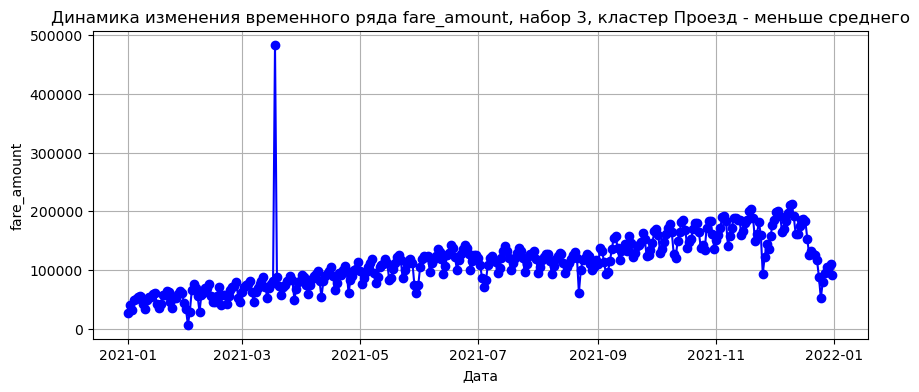

<Figure size 1000x400 with 0 Axes>

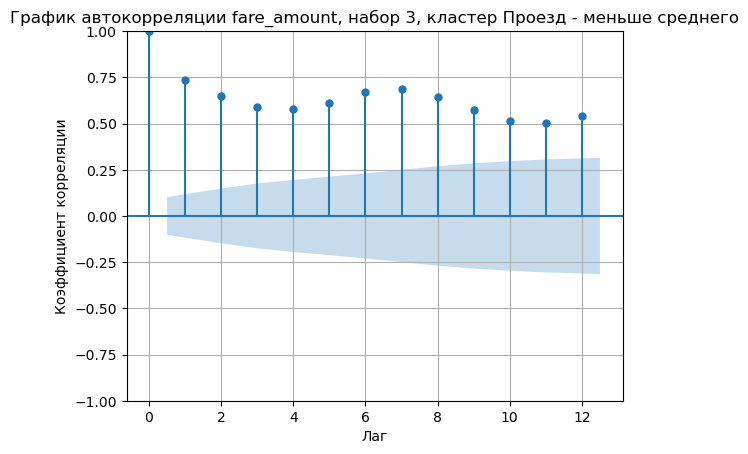

<Figure size 1000x800 with 0 Axes>

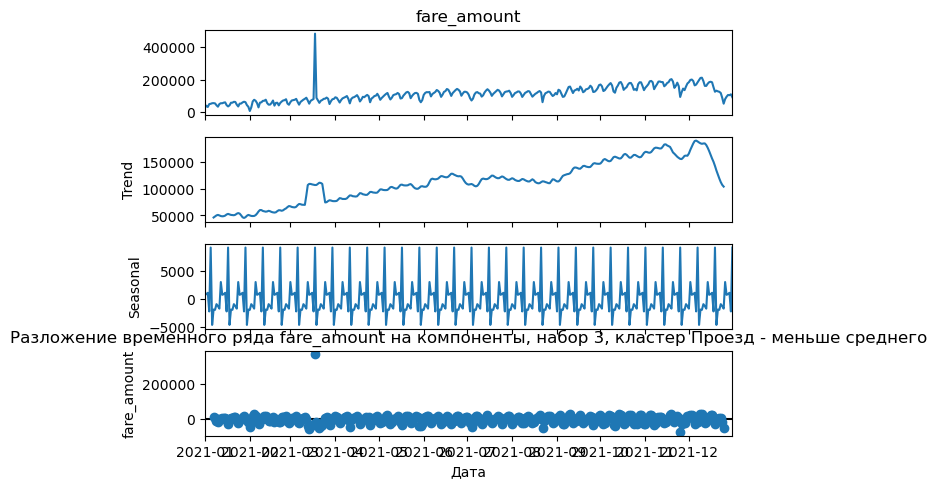

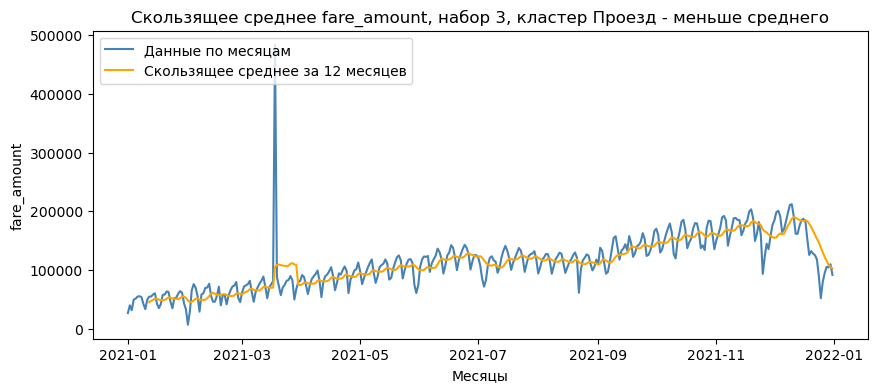

In [58]:
graf_line_corr_seasonal('fare_amount', 'Проезд - меньше среднего')

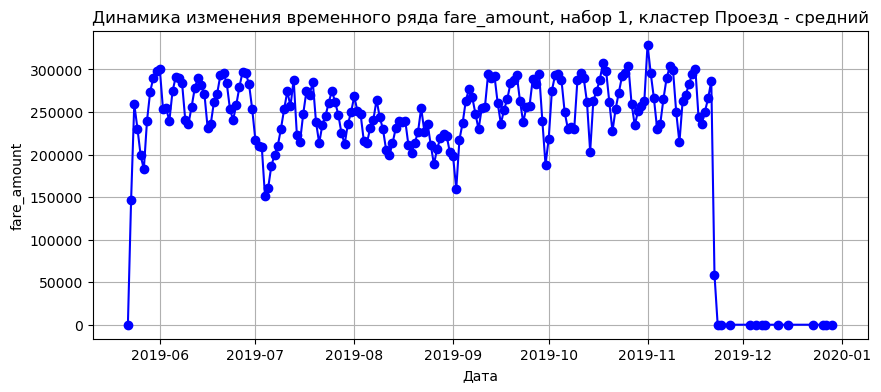

<Figure size 1000x400 with 0 Axes>

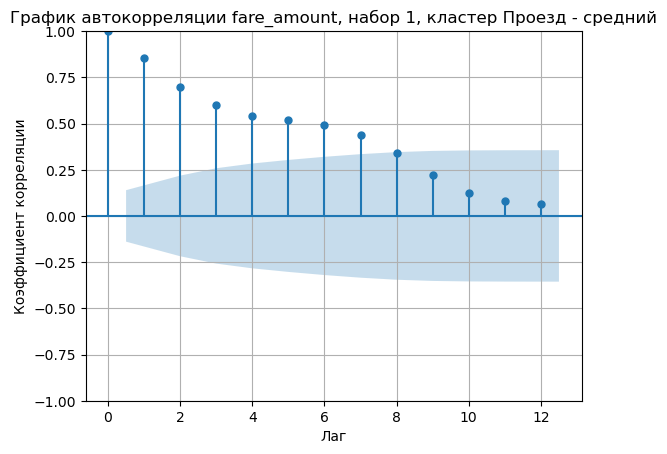

<Figure size 1000x800 with 0 Axes>

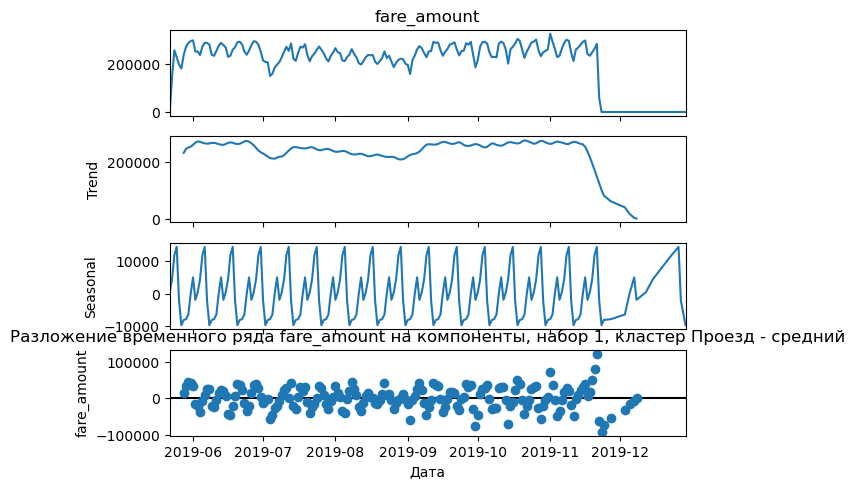

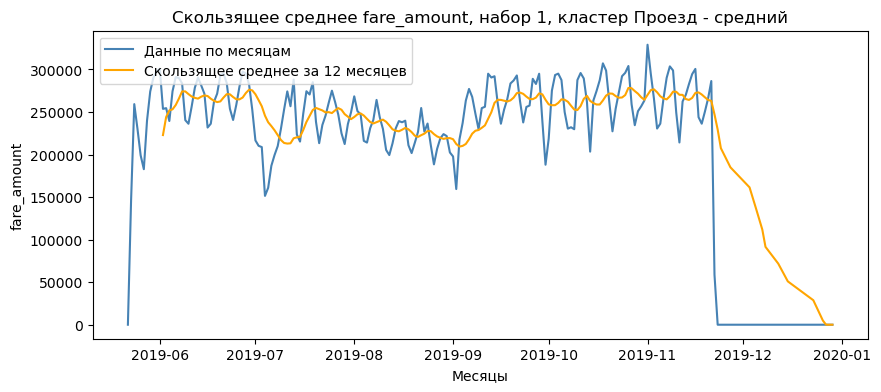

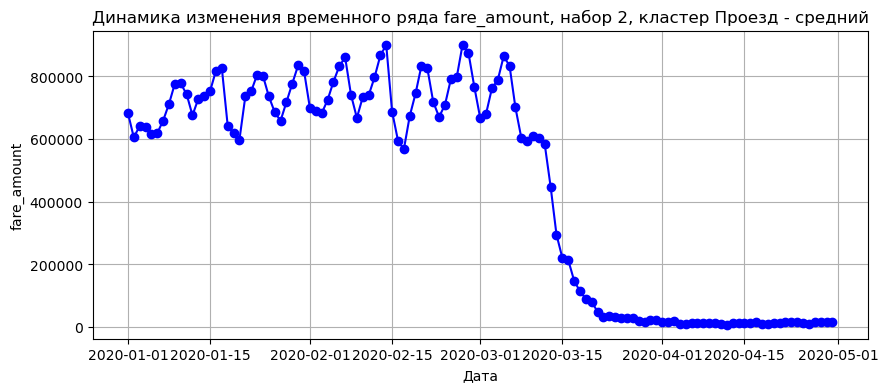

<Figure size 1000x400 with 0 Axes>

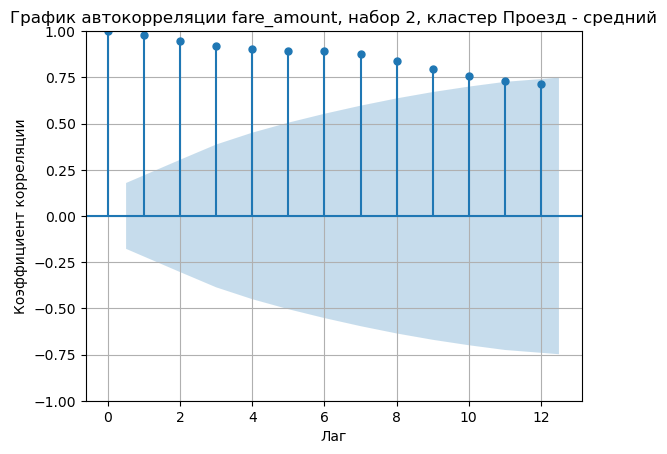

<Figure size 1000x800 with 0 Axes>

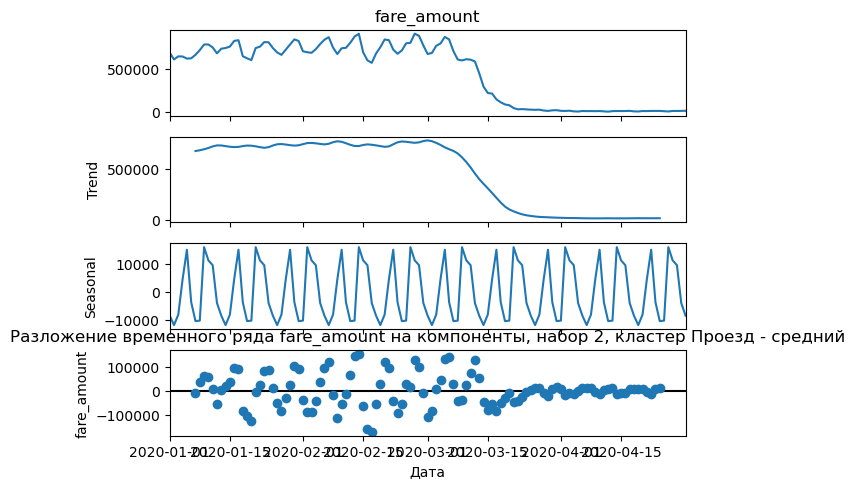

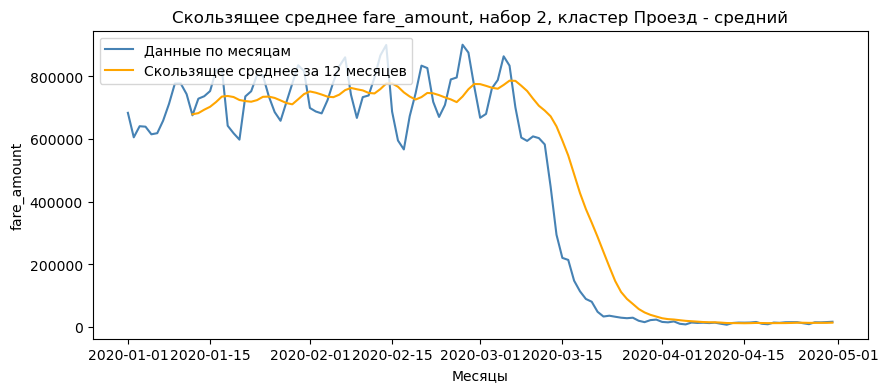

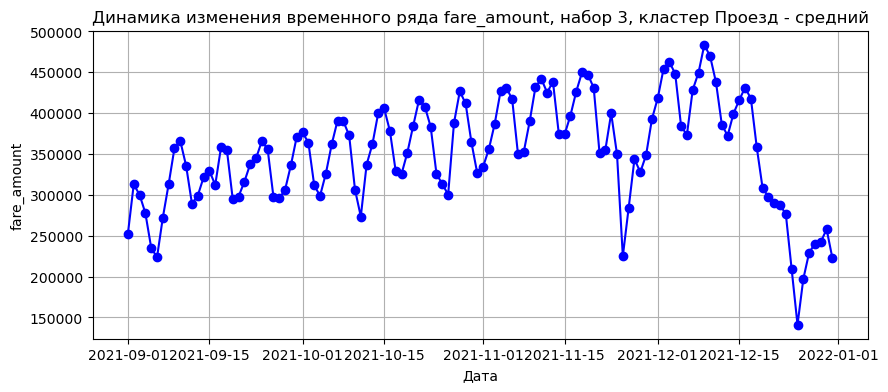

<Figure size 1000x400 with 0 Axes>

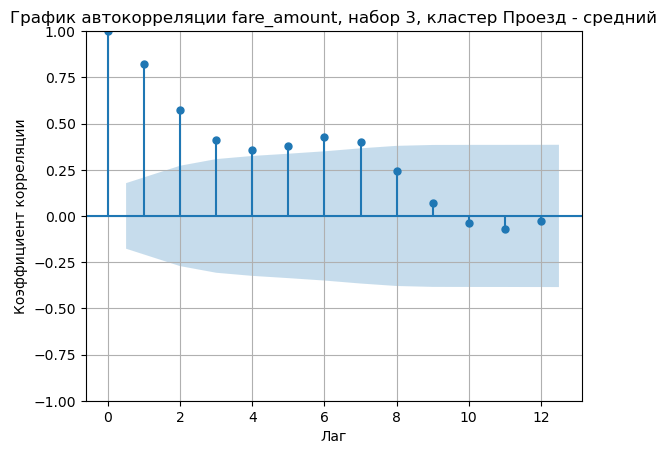

<Figure size 1000x800 with 0 Axes>

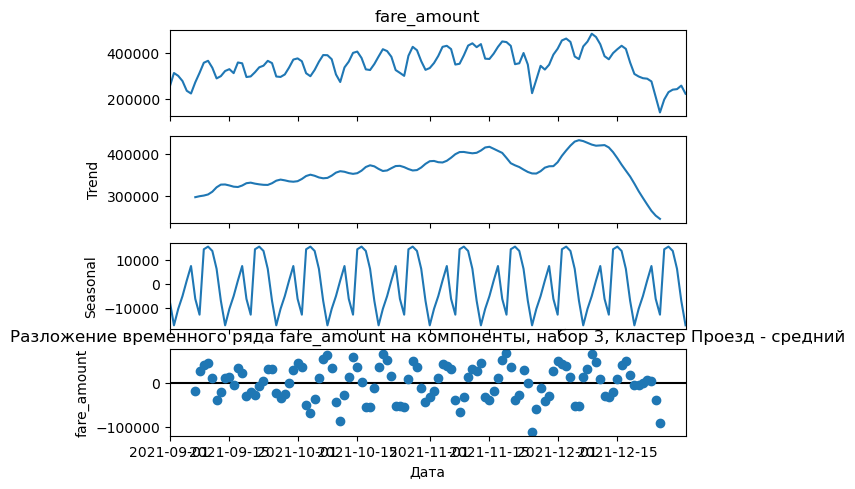

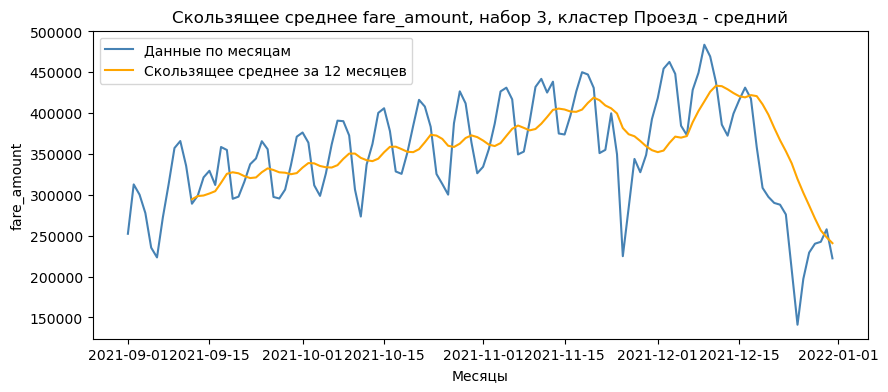

In [59]:
graf_line_corr_seasonal('fare_amount', 'Проезд - средний')

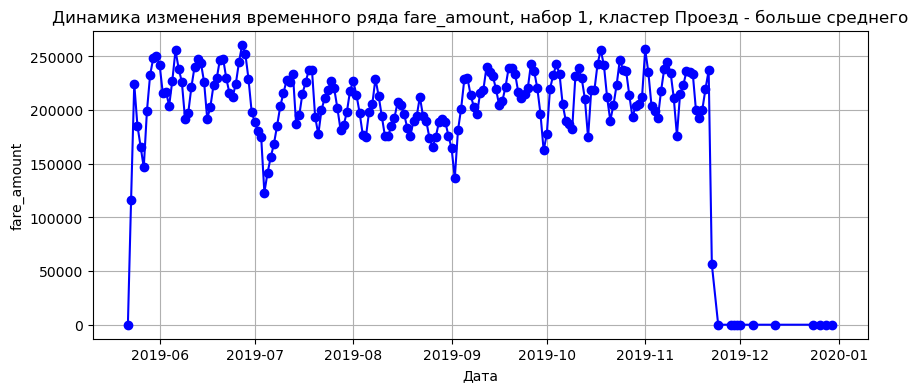

<Figure size 1000x400 with 0 Axes>

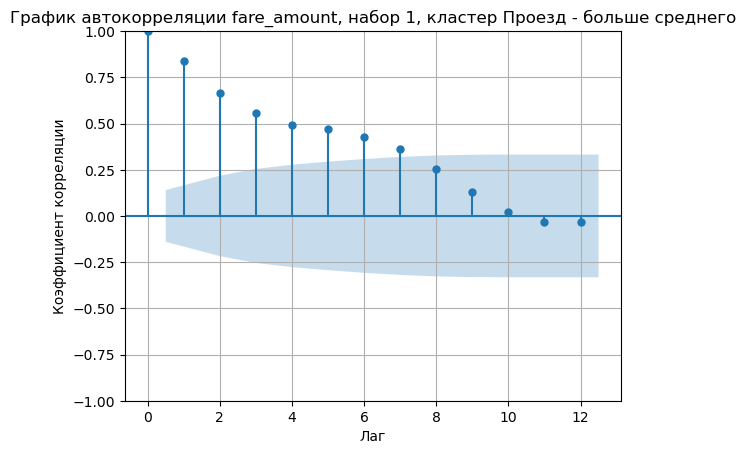

<Figure size 1000x800 with 0 Axes>

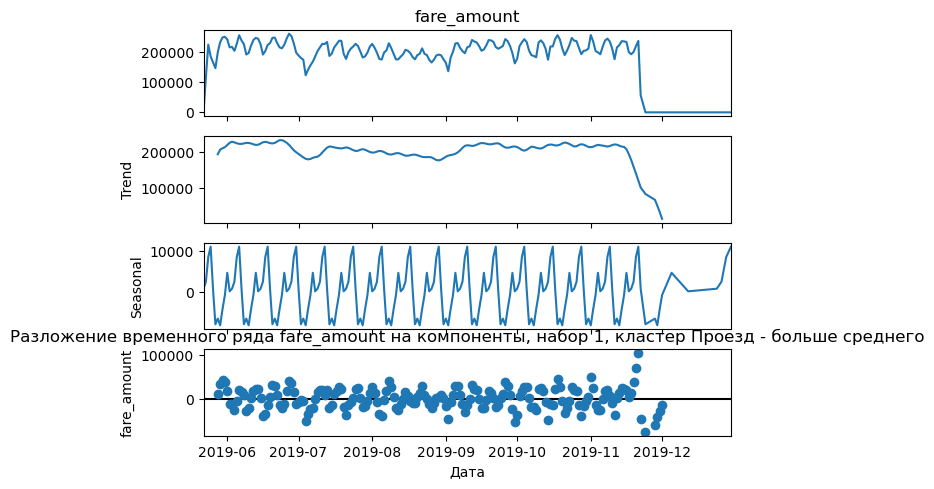

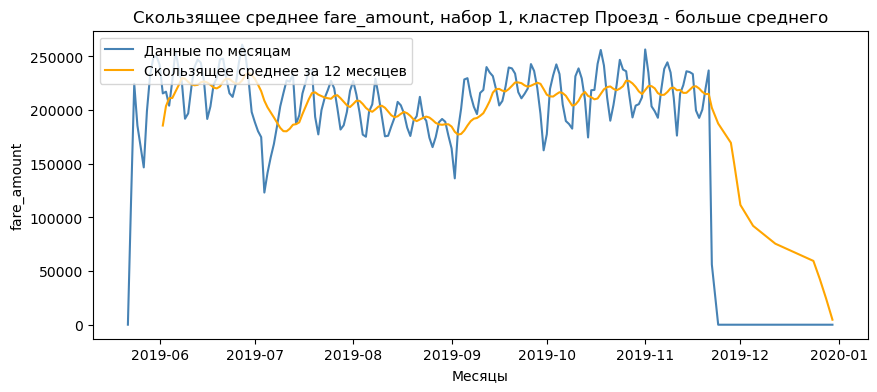

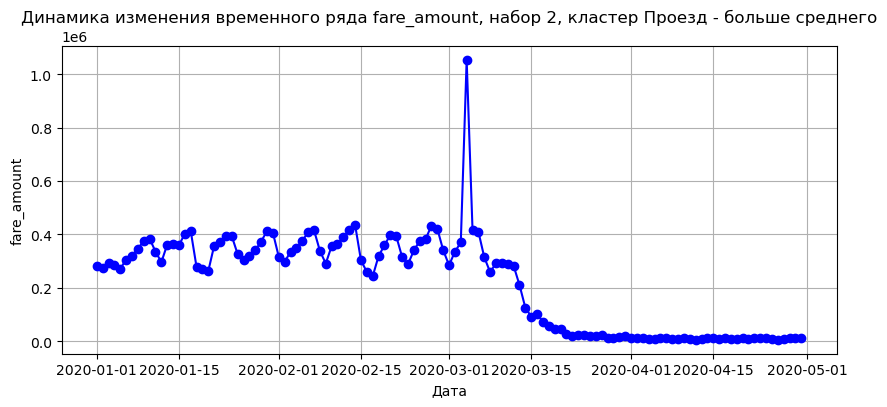

<Figure size 1000x400 with 0 Axes>

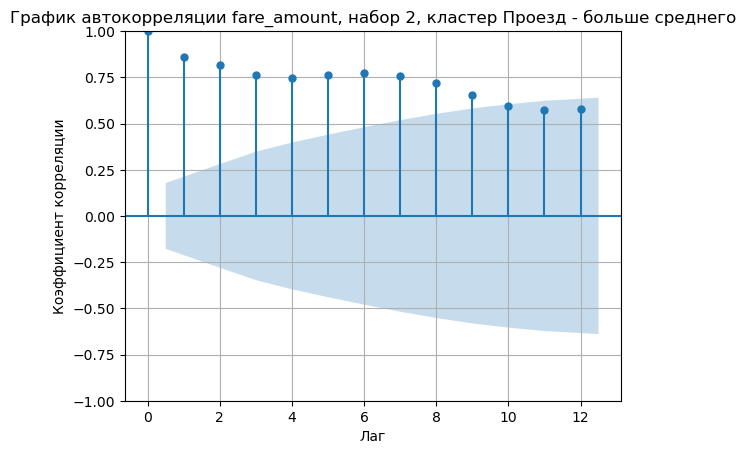

<Figure size 1000x800 with 0 Axes>

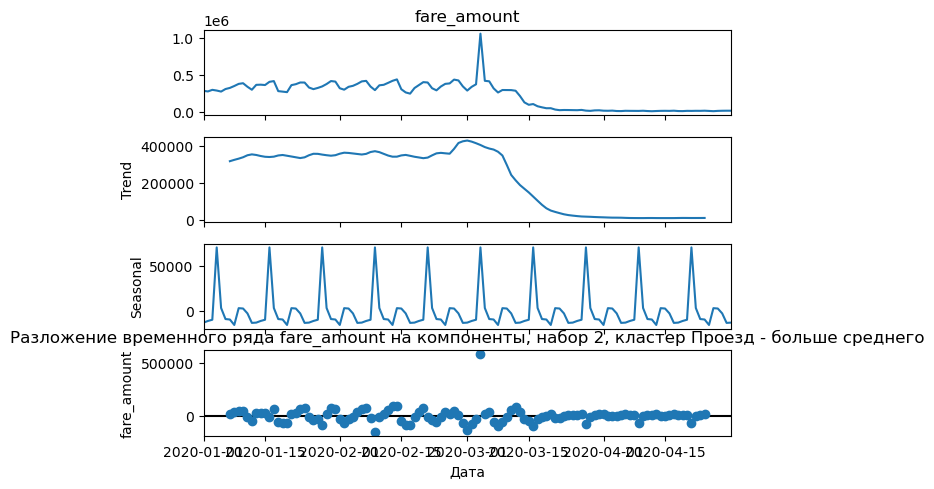

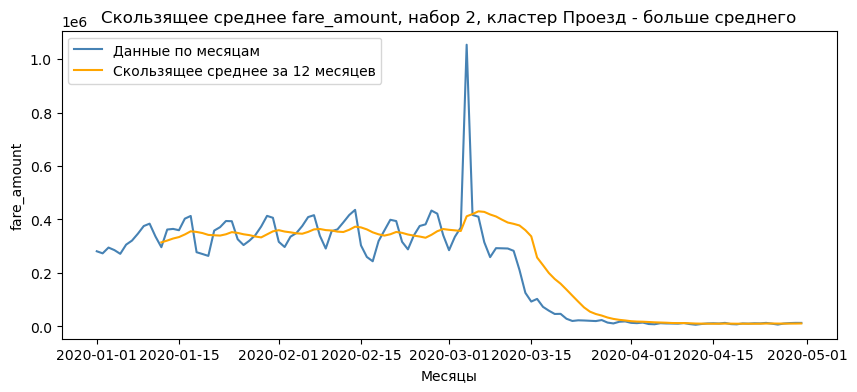

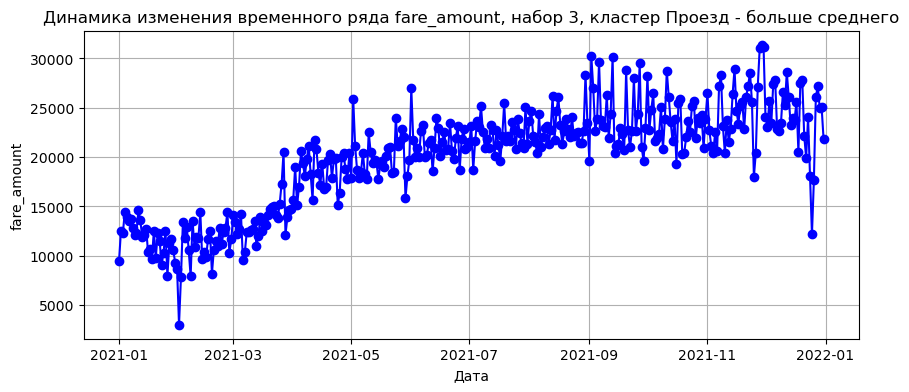

<Figure size 1000x400 with 0 Axes>

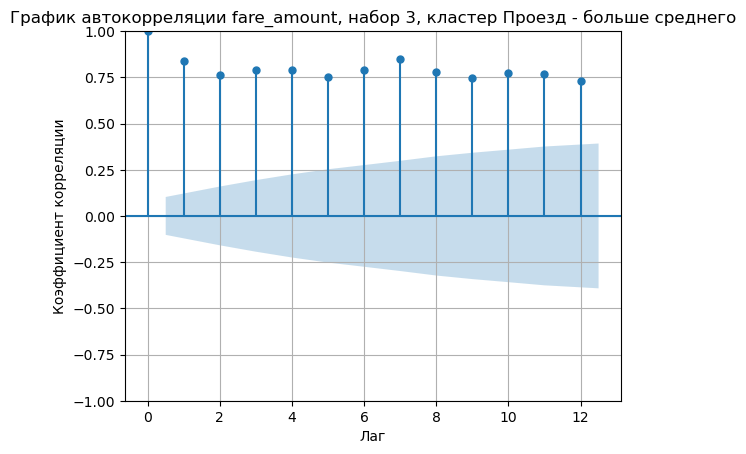

<Figure size 1000x800 with 0 Axes>

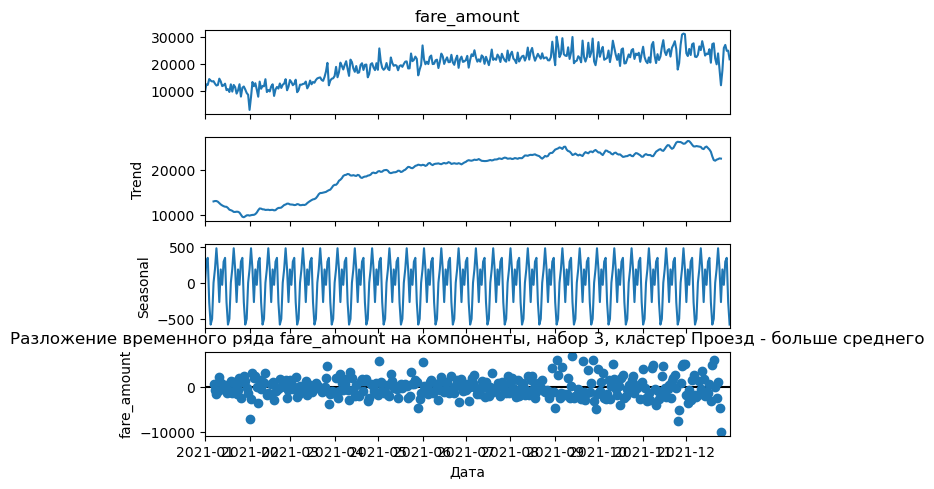

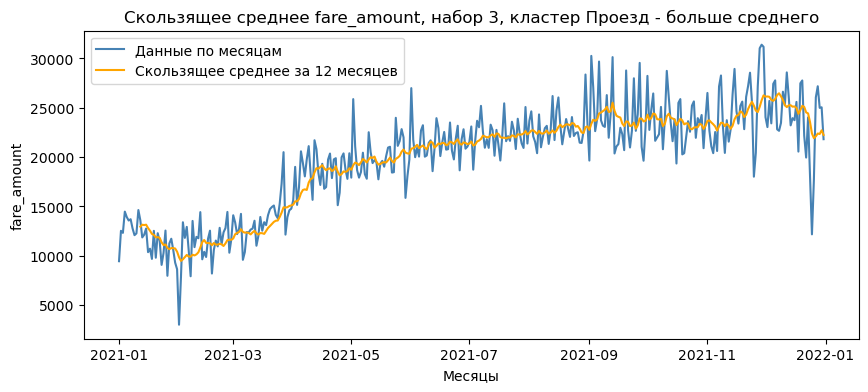

In [60]:
graf_line_corr_seasonal('fare_amount', 'Проезд - больше среднего')

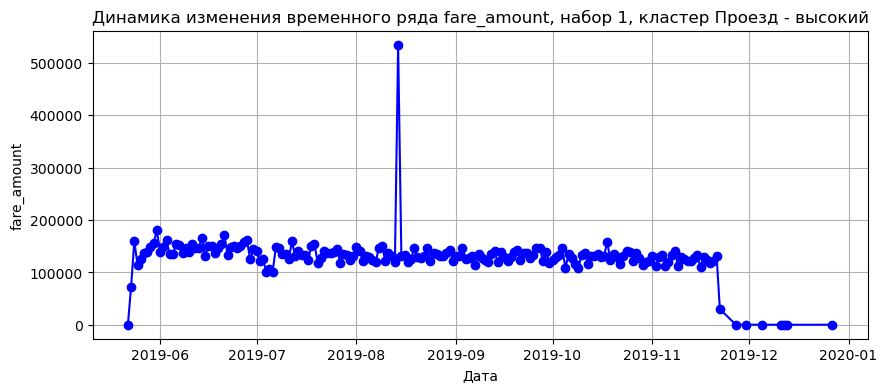

<Figure size 1000x400 with 0 Axes>

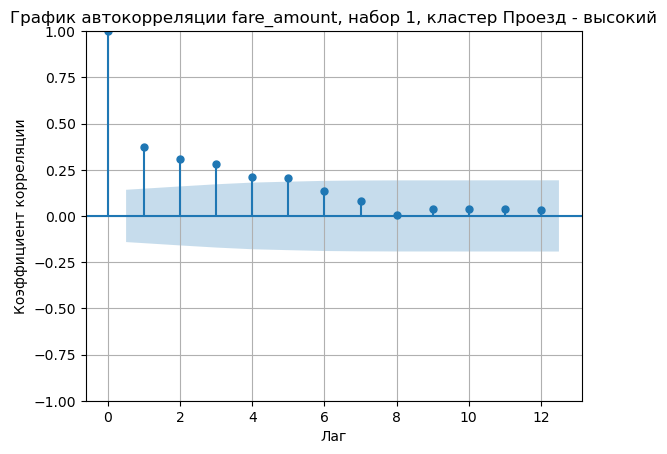

<Figure size 1000x800 with 0 Axes>

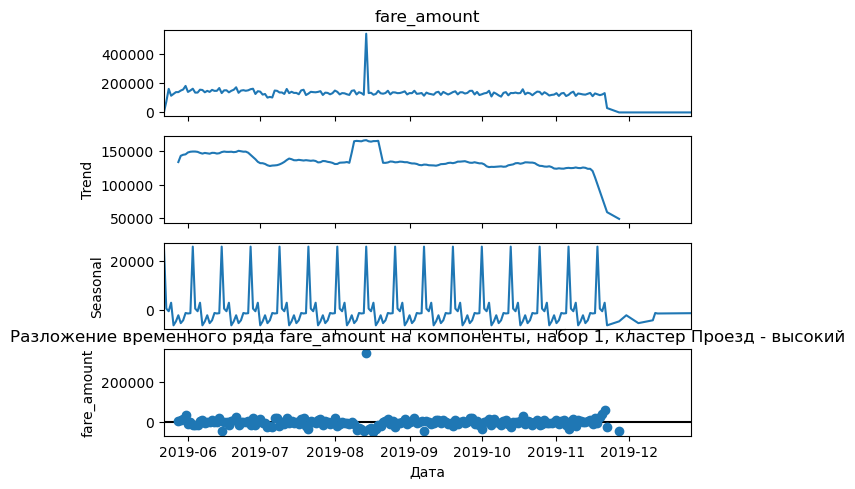

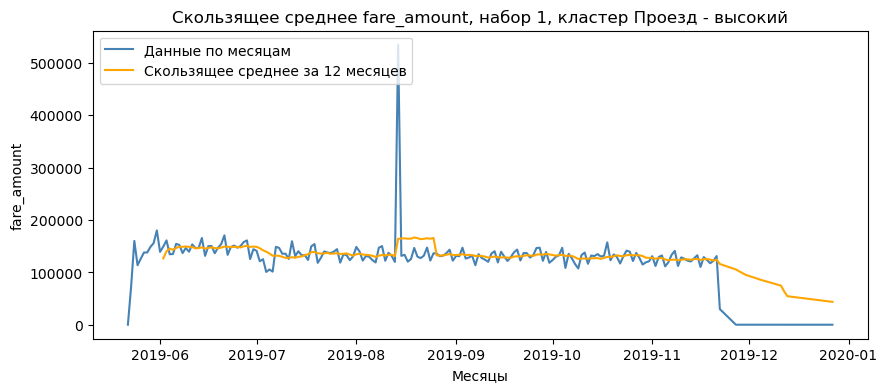

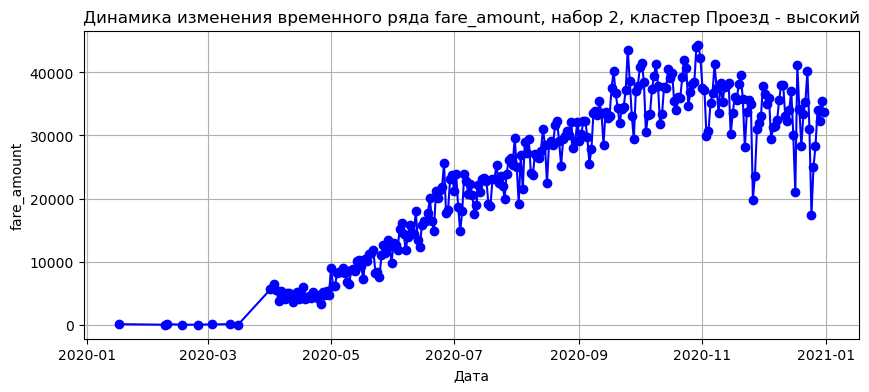

<Figure size 1000x400 with 0 Axes>

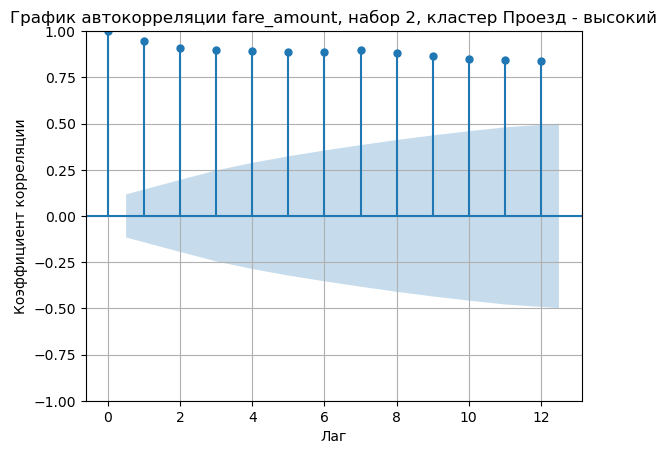

<Figure size 1000x800 with 0 Axes>

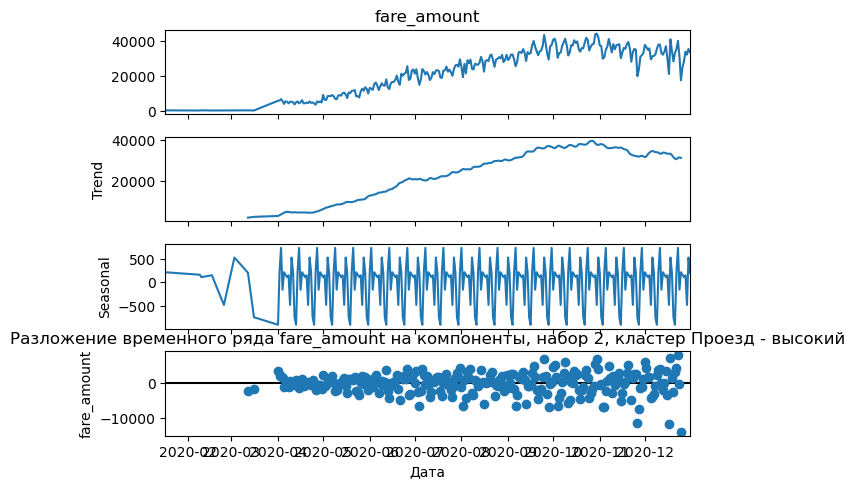

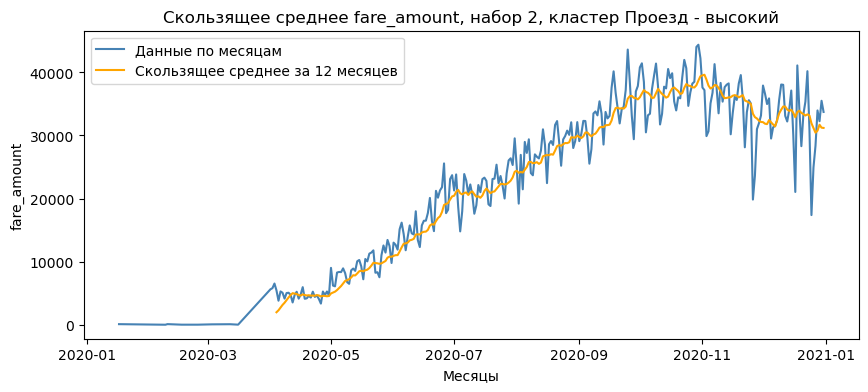

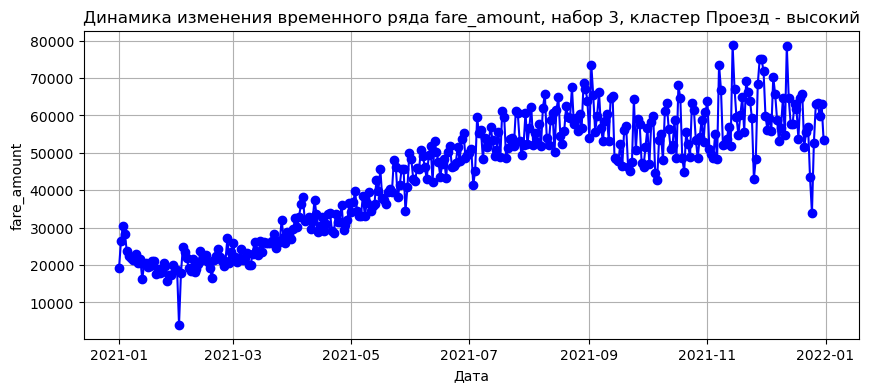

<Figure size 1000x400 with 0 Axes>

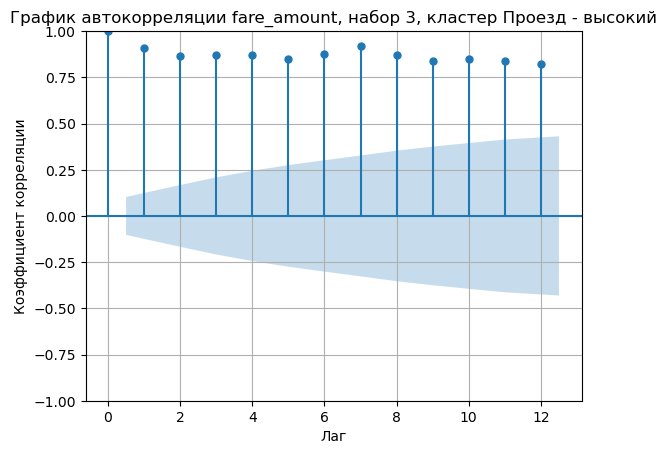

<Figure size 1000x800 with 0 Axes>

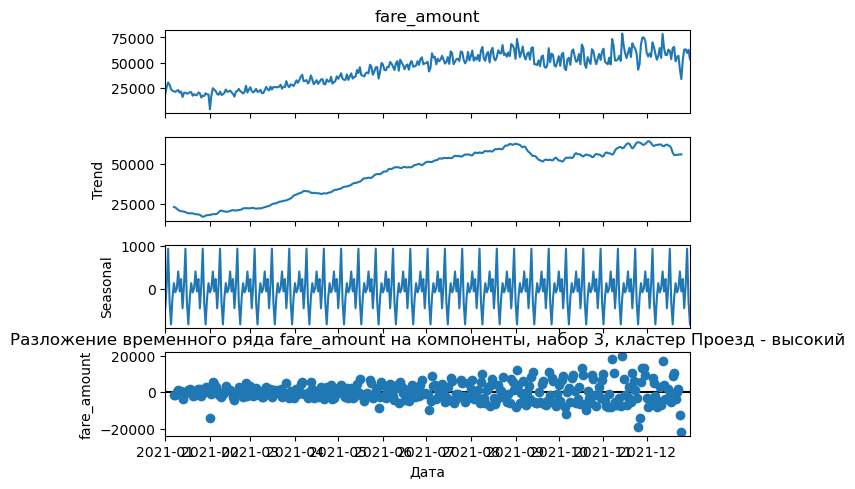

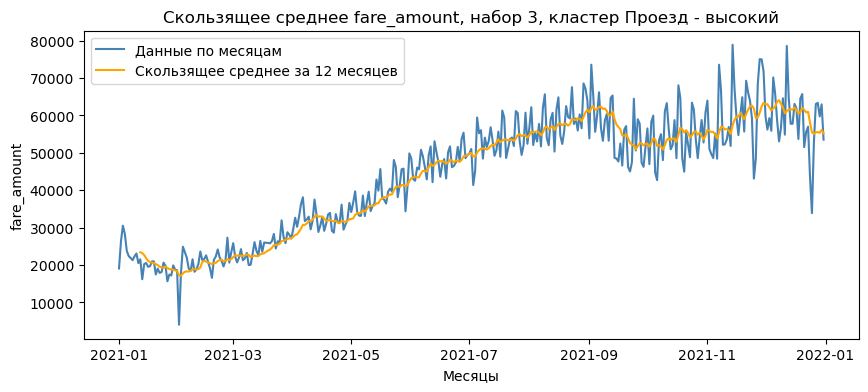

In [61]:
graf_line_corr_seasonal('fare_amount', 'Проезд - высокий')

## 3.3 Прогнозирование динамики изменения характеристик

Требуется на основе выявленных характеристик сделайть прогноз изменения значений на последующий период. Прогноз должен отражать динамику минимум на два года вперёд. Визуализируйте результаты прогнозирования для каждой характеристики.

### План:

    Выбрать три модели для прогнозирования временого ряда;
    Сделать пробный прогноз на трёх моделях;
    Определить лучшую модель;
    Спрогнозировать данные с помощью лучшей модели и отобразить прогноз графиками;


### Выбор моделей

### Прогноз NaiveForecaster

In [74]:
my_df = df2019.set_index(pd.PeriodIndex(df2019.index, freq='D'))

In [75]:
my_df = my_df.groupby(my_df.index)['fare_amount'].sum()
my_df

tpep_pickup_datetime
2019-05-22         86.50
2019-05-23     677343.93
2019-05-24    1281220.19
2019-05-25     972209.99
2019-05-26     878050.59
                 ...    
2019-12-26         58.50
2019-12-27          7.00
2019-12-28         40.50
2019-12-29          9.00
2019-12-30          6.50
Freq: D, Name: fare_amount, Length: 217, dtype: float64

In [83]:
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.naive import NaiveForecaster
from sktime.utils.plotting import plot_series
from sktime.performance_metrics.forecasting import MeanAbsolutePercentageError
from sktime.forecasting.arima import ARIMA
from sktime.forecasting.bats import BATS

In [84]:
test_size = int(my_df.shape[0]*0.3)
test_size

65

In [85]:
y_train, y_test = temporal_train_test_split(my_df, test_size=test_size)

In [91]:
fh = ForecastingHorizon(y_test.index, is_relative=False)

### NaiveForecaster

In [86]:
forecaster = NaiveForecaster(strategy="last", sp=7)
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
y_pred

tpep_pickup_datetime
2019-10-21    1047949.80
2019-10-22    1322689.40
2019-10-23    1382340.19
2019-10-24    1457204.55
2019-10-25    1502105.25
                 ...    
2019-12-26    1457204.55
2019-12-27    1502105.25
2019-12-28    1285297.96
2019-12-29    1189652.58
2019-12-30    1047949.80
Freq: D, Name: fare_amount, Length: 65, dtype: float64

(<Figure size 1600x400 with 1 Axes>, <Axes: ylabel='fare_amount'>)

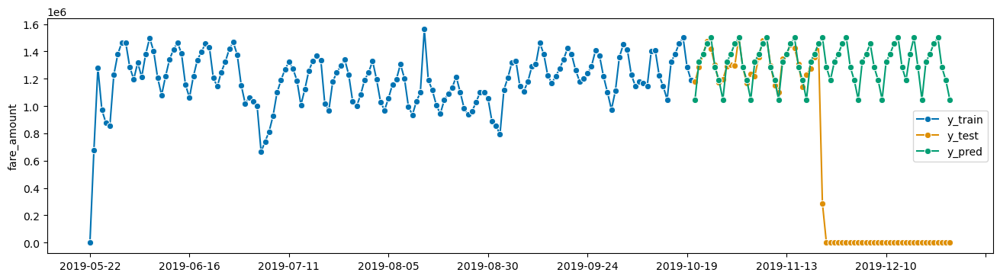

In [87]:
# график
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])

In [88]:
mape = MeanAbsolutePercentageError(symmetric=False)
mape(y_test, y_pred)

36803.92839058199

### ARIMA

In [157]:
forecaster = ARIMA(
    order=(1, 1, 0), seasonal_order=(0, 1, 0, 12), suppress_warnings=True
)
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
y_pred

2019-10-21    1.148643e+06
2019-10-22    1.395266e+06
2019-10-23    1.399724e+06
2019-10-24    1.212975e+06
2019-10-25    1.131683e+06
                  ...     
2019-12-26    8.214198e+05
2019-12-27    8.678501e+05
2019-12-28    9.294942e+05
2019-12-29    9.611747e+05
2019-12-30    7.311471e+05
Freq: D, Name: fare_amount, Length: 65, dtype: float64

(<Figure size 1600x400 with 1 Axes>, <Axes: ylabel='fare_amount'>)

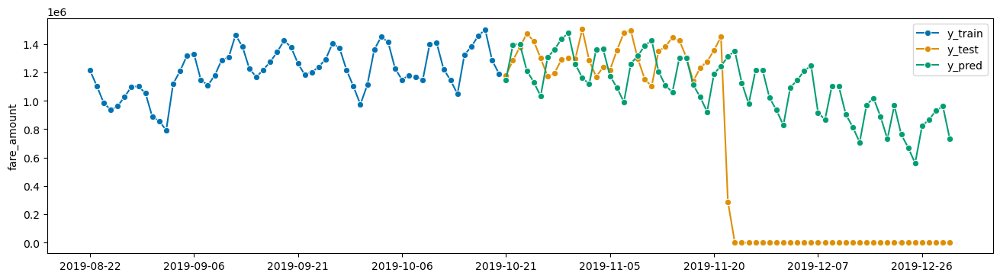

In [158]:
plot_series(y_train.tail(60), y_test, y_pred, labels=["y_train", "y_test", "y_pred"])

In [159]:
mape(y_test, y_pred)

26787.94272724859

### BATS

47167.391652648956

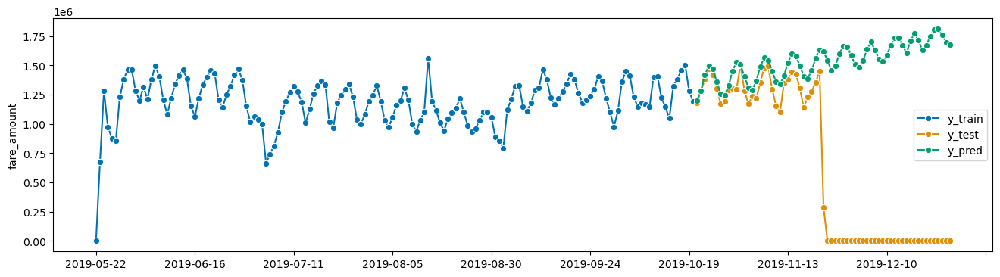

In [160]:
forecaster = BATS(sp=12, use_trend=True, use_box_cox=False)
forecaster.fit(y_train)
y_pred = forecaster.predict(fh)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"])
mape(y_test, y_pred)